# Chest X-Ray Captions Using Transformers and the ReXGradient-160K Dataset

ReXGradient-160K: A Large-Scale Publicly Available Dataset of Chest Radiographs with Free-text Reports.
[HuggingFace](https://huggingface.co/datasets/rajpurkarlab/ReXGradient-160K).
[Article](https://arxiv.org/abs/2505.00228)

Original source code: [GitHub](https://github.com/shreydan/VisionGPT2), [Kaggle](https://www.kaggle.com/code/shreydan/visiongpt2-image-captioning-pytorch).
This project is a modified version of the original code above.

## Helper functions and libraries

In [1]:
GPU = 2  # GPU number. After change, restart the kernel

%set_env CUDA_VISIBLE_DEVICES={GPU}

import torch

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

if torch.cuda.is_available():  # make sure GPU is available
    num = torch.cuda.device_count()
    print(f"GPU count: {num}")
    for i in range(num):
        print(f"GPU {i} name: {torch.cuda.get_device_name(i)}")
else:
    print("GPU is not available")

env: CUDA_VISIBLE_DEVICES=2
PyTorch version: 2.9.1+cu128
CUDA available: True
GPU count: 1
GPU 0 name: Tesla V100-PCIE-16GB


In [2]:
import os
import gc
import re
import math
import random
import requests  # download images using URL
import numpy as np
import pandas as pd
import nibabel as nib
import multiprocessing
import albumentations as alb
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as fn

import timm
import transformers as hf

from PIL import Image
from io import BytesIO
from tqdm.auto import tqdm
from itertools import islice
from types import SimpleNamespace
from matplotlib.ticker import MaxNLocator
from albumentations.pytorch import ToTensorV2


def set_seed(seed: int = 42):
    """ Set random seed for reproducibility """
    random.seed(seed)
    hf.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True
    torch.backends.cudnn.deterministic = False


set_seed()

ENCODER = "vit_base_patch16_224"
DECODER = "gpt2"
MAX_TOKENS = 200  # one token is approximately 4 characters long

PATH = "/data/paulenka/dataset_ReXGradient-160K/dataset"
DS_PATH   = f"{PATH}/deid_png"
TRAIN_CSV = f"{PATH}/metadata/train_metadata.csv"
VALID_CSV = f"{PATH}/metadata/valid_metadata.csv"
TEST_CSV  = f"{PATH}/metadata/test_metadata.csv"

TEMP = "temp"  # path to temporal directory with data
os.makedirs(TEMP, exist_ok=True)  # create temporal directory

CPU = multiprocessing.cpu_count()
NUM_WORKERS = math.ceil(CPU * 3/5)
print(f"Number of CPU cores: {CPU}")
print(f"Number of worker cores: {NUM_WORKERS}")

DEVICE = f"cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")
if "cuda" in DEVICE:
    # Get the index of the current CUDA device
    current_device_index = torch.cuda.current_device()
    # Get the name of the current CUDA device
    device_name = torch.cuda.get_device_name(current_device_index)
    print(f"Current CUDA device name: {device_name}")
else:
    print("CUDA is not available. Using CPU")

Number of CPU cores: 32
Number of worker cores: 20
Using device: cuda
Current CUDA device name: Tesla V100-PCIE-16GB


## Loading, processing and analysing the dataset

In [3]:
# Load the dataset
df_train = pd.read_csv(TRAIN_CSV)
df_valid = pd.read_csv(VALID_CSV)
df_test  = pd.read_csv(TEST_CSV)

display(df_train.head(3))  # show first rows
print()

for row in islice(df_train.itertuples(), 3):  # print first rows
    print(*row, sep=" | ", end="\n\n")

,id,AccessionNumber,StudyInstanceUid,PatientSex,PatientAge,StudyDate,StudyDescription,Indication,Comparison,Findings,Impression
0,pGRDNLZHK1CJMB9DS_aGRDNLD4ATLU63FN8_s1.2.826.0...,GRDNLD4ATLU63FN8,1.2.826.0.1.3680043.8.498.98869902613028373370...,M,007Y,20100722,DG CHEST 2V,"Cough, fever",NaN,No active infiltrate or effusion is seen. Only...,No pneumonia. Mild peribronchial thickening.
1,pGRDN558B6N940827_aGRDNJRM2EFFASEDX_s1.2.826.0...,GRDNJRM2EFFASEDX,1.2.826.0.1.3680043.8.498.82596686537958139226...,M,057Y,20160114,DG CHEST 2V,Productive cough for 1 month. Smoker.,NaN,Heart size is normal. There is no pleural effu...,1. No acute cardiopulmonary abnormalities. 2. ...
2,pGRDNS5TAGQ36EJXU_aGRDNAT079HPWLQGQ_s1.2.826.0...,GRDNAT079HPWLQGQ,1.2.826.0.1.3680043.8.498.45885543378002630863...,F,061Y,20190327,DG CHEST 2V,Midsternal pain 2 hours.,Comparison with prior exam from 04/10/2015.,Lungs are adequately inflated without focal ai...,No active cardiopulmonary disease.



0 | pGRDNLZHK1CJMB9DS_aGRDNLD4ATLU63FN8_s1.2.826.0.1.3680043.8.498.98869902613028373370176585666602171978 | GRDNLD4ATLU63FN8 | 1.2.826.0.1.3680043.8.498.98869902613028373370176585666602171978 | M | 007Y | 20100722 | DG CHEST 2V | Cough, fever | nan | No active infiltrate or effusion is seen. Only mild peribronchial thickening is noted. The heart is within normal limits in size. No bony abnormality is seen. | No pneumonia. Mild peribronchial thickening.

1 | pGRDN558B6N940827_aGRDNJRM2EFFASEDX_s1.2.826.0.1.3680043.8.498.82596686537958139226113650397090553941 | GRDNJRM2EFFASEDX | 1.2.826.0.1.3680043.8.498.82596686537958139226113650397090553941 | M | 057Y | 20160114 | DG CHEST 2V | Productive cough for 1 month. Smoker. | nan | Heart size is normal. There is no pleural effusion or edema identified. Chronic interstitial coarsening is identified bilaterally. No airspace consolidation. | 1. No acute cardiopulmonary abnormalities. 2. Chronic interstitial coarsening suggestive of emphysema.

2

In [4]:
def to_str(column):
    """ Check if column is nan value or not """
    return str(column) if not pd.isna(column) else ""


def histogram(lst, title="", xlabel="", ylabel="", log=False):
    """ Create a histogram from a list of integers. """
    # Define custom bin edges to center the integers
    start = min(lst)
    bars = max(lst) - start + 2
    bins = [start + b - 0.5 for b in range(bars)]
    # print(lst)
    # print(bins)
    color = "teal"
    edgecolor = "black" if len(bins) < 50 else color
    plt.hist(lst, bins=bins, log=log, edgecolor=edgecolor, color=color, rwidth=1.0)
    # Add labels and a title for clarity
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(axis='y', alpha=0.7)
    # Set xlabel and ylabel to integer numbers only
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    if not log:
        plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    # Display the plot
    plt.show()


def show(captions, num, start=0):
    """ Show first `num` key-value pairs in captions """
    print(f"Show {num} examples from {start} to {start + num}:")
    iterator = iter(captions.items())
    # islice(iterable, start, stop, step)
    key_value = islice(iterator, start, start + num)
    for key, value in key_value:
        image = Image.open(key).convert("I;16")  # 16-bit integer grayscale image
        plt.imshow(image, cmap="viridis")
        plt.axis("off")
        plt.tight_layout()
        plt.show()
        print(f"{key}\t", value, sep="\n\t")
    print()

Number of PNG files with caption: 238968


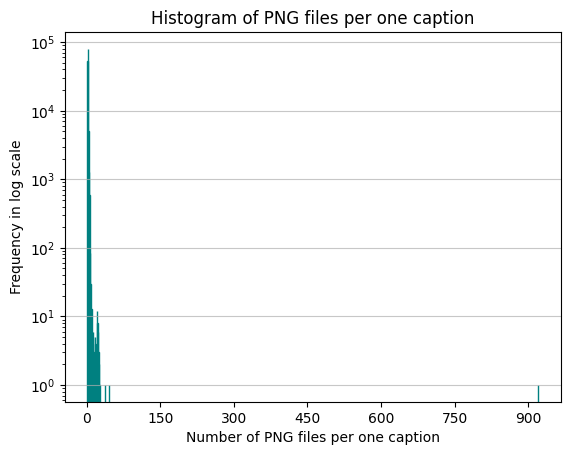

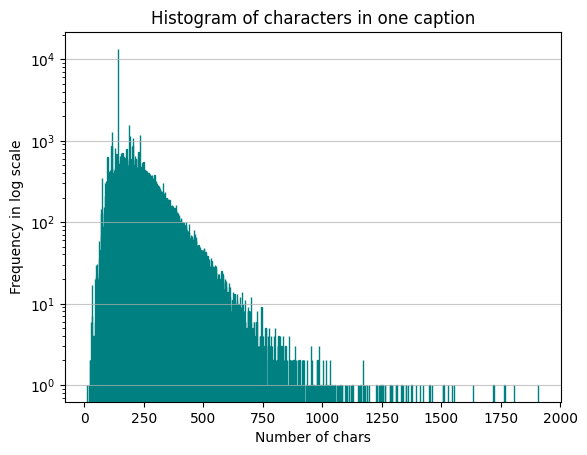

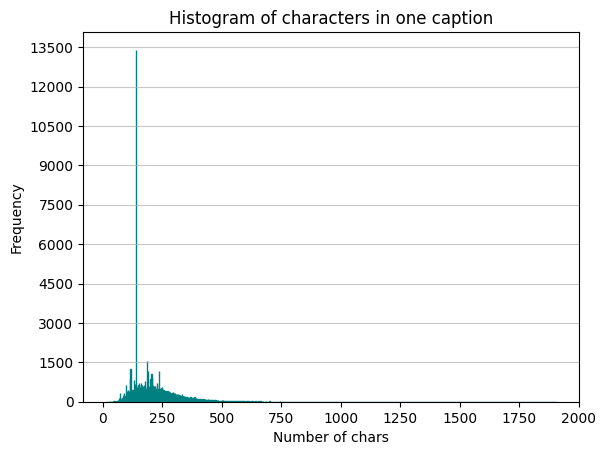

Show 2 examples from 0 to 2:


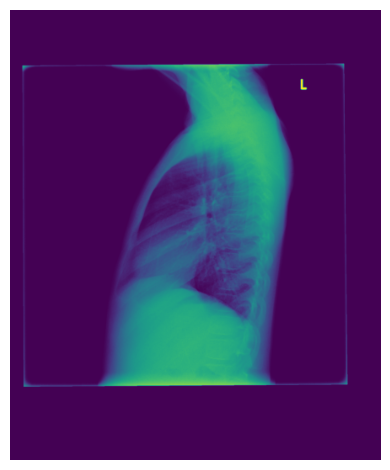

/data/paulenka/dataset_ReXGradient-160K/dataset/deid_png/GRDNLZHK1CJMB9DS/GRDNLD4ATLU63FN8/studies/1.2.826.0.1.3680043.8.498.98869902613028373370176585666602171978/series/1.2.826.0.1.3680043.8.498.44489508086983790573169420724532983101/instances/1.2.826.0.1.3680043.8.498.65641194673999635610079120121250981235.png	
	No active infiltrate or effusion is seen. Only mild peribronchial thickening is noted. The heart is within normal limits in size. No bony abnormality is seen.


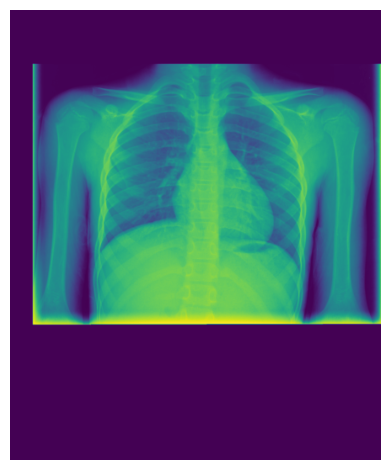

/data/paulenka/dataset_ReXGradient-160K/dataset/deid_png/GRDNLZHK1CJMB9DS/GRDNLD4ATLU63FN8/studies/1.2.826.0.1.3680043.8.498.98869902613028373370176585666602171978/series/1.2.826.0.1.3680043.8.498.27551498707162286525224764653015866573/instances/1.2.826.0.1.3680043.8.498.43476901480161882855669450288924330642.png	
	No active infiltrate or effusion is seen. Only mild peribronchial thickening is noted. The heart is within normal limits in size. No bony abnormality is seen.

Number of PNG files with caption: 17007


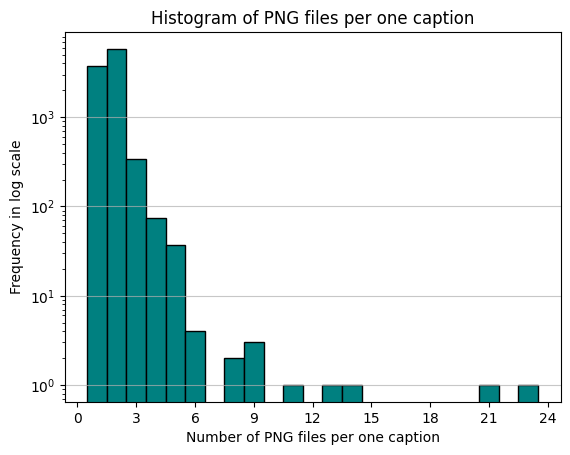

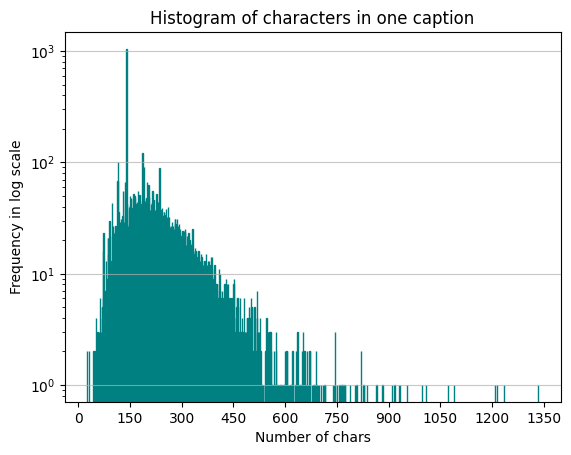

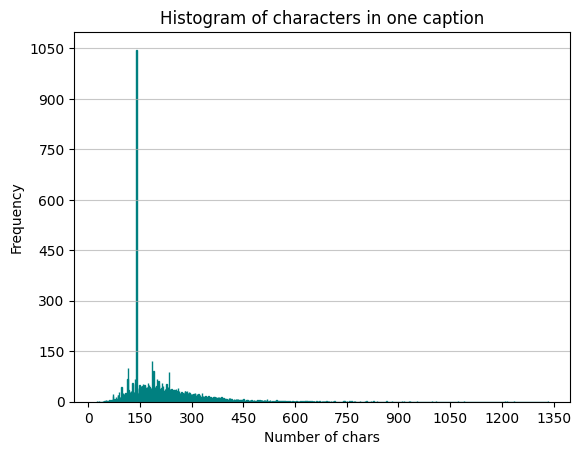

Show 2 examples from 0 to 2:


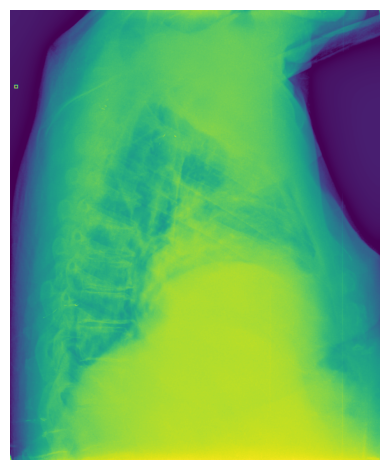

/data/paulenka/dataset_ReXGradient-160K/dataset/deid_png/GRDNRZ6LE5QCTQ5A/GRDNZ9W6GFJMI7SO/studies/1.2.826.0.1.3680043.8.498.96466585901041020901411755035473531374/series/1.2.826.0.1.3680043.8.498.59425159848405213029298826561879810186/instances/1.2.826.0.1.3680043.8.498.51759003029321912113312962240139898600.png	
	The lungs are poorly expanded with volume loss at both lung bases. There is no pleural effusion or pneumothorax. The pulmonary vasculature is unremarkable. The heart appears enlarged. No significant osseous abnormality is appreciated.


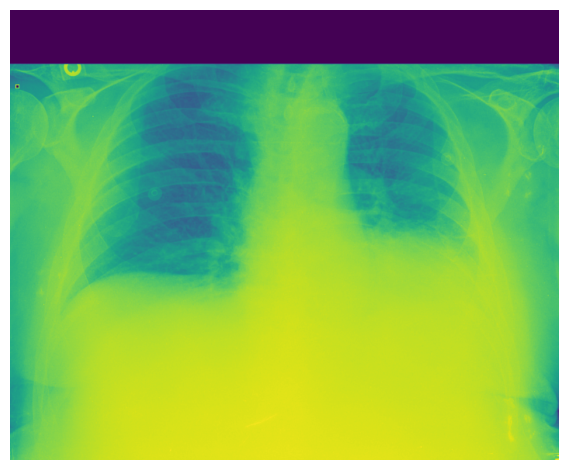

/data/paulenka/dataset_ReXGradient-160K/dataset/deid_png/GRDNRZ6LE5QCTQ5A/GRDNZ9W6GFJMI7SO/studies/1.2.826.0.1.3680043.8.498.96466585901041020901411755035473531374/series/1.2.826.0.1.3680043.8.498.76666101311341643348555418433763991886/instances/1.2.826.0.1.3680043.8.498.91417296143984425049449792185790996787.png	
	The lungs are poorly expanded with volume loss at both lung bases. There is no pleural effusion or pneumothorax. The pulmonary vasculature is unremarkable. The heart appears enlarged. No significant osseous abnormality is appreciated.

Number of PNG files with caption: 17029


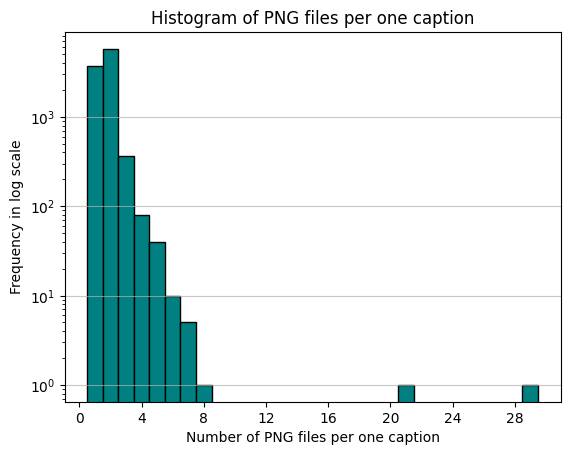

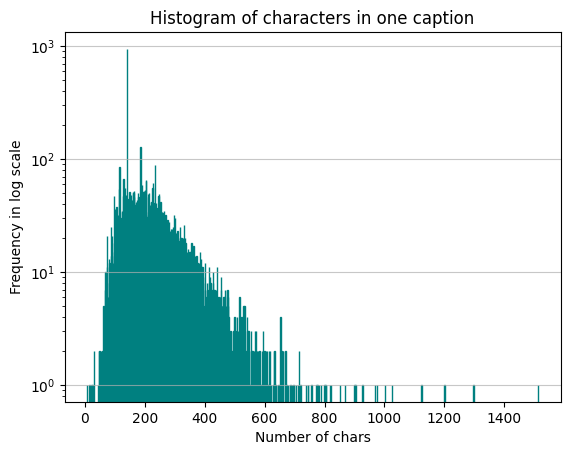

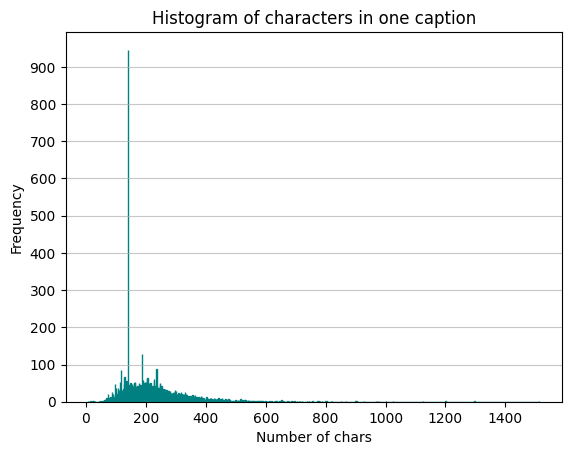

Show 2 examples from 0 to 2:


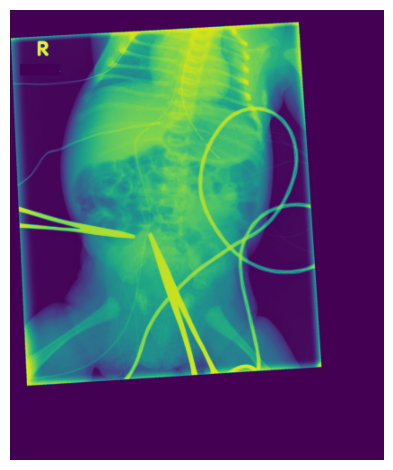

/data/paulenka/dataset_ReXGradient-160K/dataset/deid_png/GRDN4SZYTXK18ZTE/GRDNXJ9IBYKTA6ZJ/studies/1.2.826.0.1.3680043.8.498.41432772122085702344820063914742446917/series/1.2.826.0.1.3680043.8.498.31237460284934991919963506231562557994/instances/1.2.826.0.1.3680043.8.498.83442985880054869626823907747404816134.png	
	UVC terminates over the high right atrium. Orogastric tube is appropriately positioned. Bowel gas pattern is normal. Lung bases are clear.


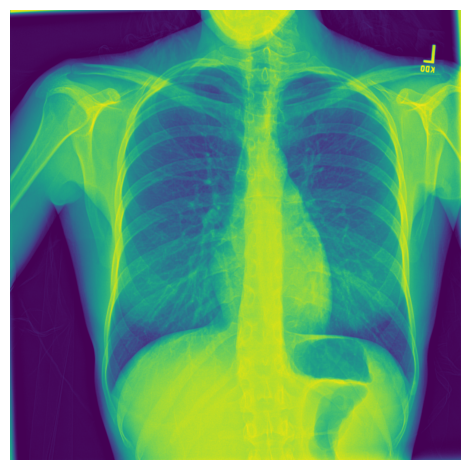

/data/paulenka/dataset_ReXGradient-160K/dataset/deid_png/GRDN1OEG6BSTQ6CM/GRDN8O331QMUB0K5/studies/1.2.826.0.1.3680043.8.498.15878559140106816319848840394221638346/series/1.2.826.0.1.3680043.8.498.85283414713357677286440575445934753294/instances/1.2.826.0.1.3680043.8.498.45720502760705455607792237958558057624.png	
	The heart size and mediastinal contours are within normal limits. Both lungs are clear. The visualized skeletal structures are unremarkable.



In [5]:
def process_csv(df):
    """ Process CSV files of ReXGradient-160K dataset """
    captions = {}  # captions dictionary. Key is PNG file. Value is caption
    png_per_caption = []  # histogram of PNG files per one caption
    chars_per_caption = []  # histogram of chars in the caption

    # Process the CSV file
    # for row in islice(df.itertuples(), 100):  # test only first rows
    for row in df.itertuples():

        # List of coumns for caption:
        #   [StudyDescription, Indication, Findings, Impression]
        columns = [
            # to_str(row.StudyDescription) + "." if not pd.isna(row.StudyDescription) else "",
            # to_str(row.Indication),
            to_str(row.Findings),
            # to_str(row.Impression),
        ]

        # Naive approach. Concatenate all the strings
        caption = " ".join(columns)
        chars_per_caption.append(len(caption))

        # Process the row.id column with regular expression
        pattern = r"^p(.*?)_a(.*?)_s([\d.]+)$"  # lazy pattern (.*?)
        match = re.search(pattern, row.id)

        # Get path to the PNG images
        path = f"{DS_PATH}/{match.group(1)}/{match.group(2)}/studies/{match.group(3)}/series"

        png_number = 0  # number of PNG per caption
        # os.walk recursively traverses the directory and its subdirectories
        for root, dirs, files in os.walk(path):
            for file in files:
                # Check if file name is PNG
                if file.lower().endswith(".png"):
                    png_number += 1  # one more PNG per caption
                    png_path = f"{root}/{file}"  # PNG with full path
                    captions[png_path] = caption  # several PNGs can have 1 caption
        # print("\r", *file_paths, sep="\n\t", end="\n")
        png_per_caption.append(png_number)

    print(f"Number of PNG files with caption: {sum(png_per_caption)}")
    
    histogram(png_per_caption, title="Histogram of PNG files per one caption",
              xlabel="Number of PNG files per one caption",
              ylabel="Frequency in log scale", log=True)
    histogram(chars_per_caption, title="Histogram of characters in one caption",
              xlabel="Number of chars",
              ylabel="Frequency in log scale", log=True)
    histogram(chars_per_caption, title="Histogram of characters in one caption",
              xlabel="Number of chars",
              ylabel="Frequency", log=False)

    show(captions, 2)  # show several examples
    return captions  # dictionary of PNG-caption pairs


captions_train = process_csv(df_train)
captions_valid = process_csv(df_valid)
captions_test  = process_csv(df_test)

Number of indices in the dataset: 109487
Number of AccessionNumber cases: 160000
Number of studies: 160000
Number of series: 257995
Number of instances: 273004
Number of PNG files: 273004
There are 0 PNG without description.
There are 0 empty instances without PNG.


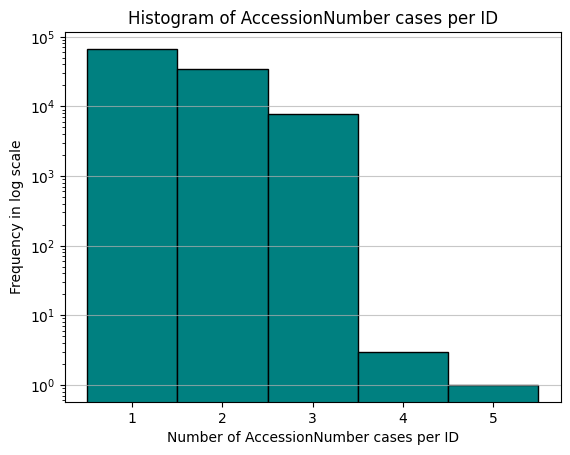

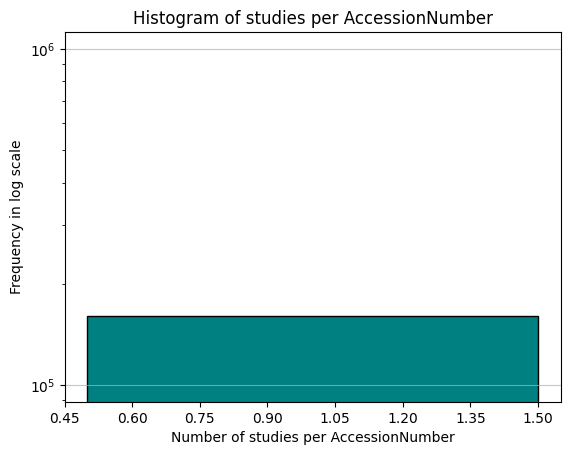

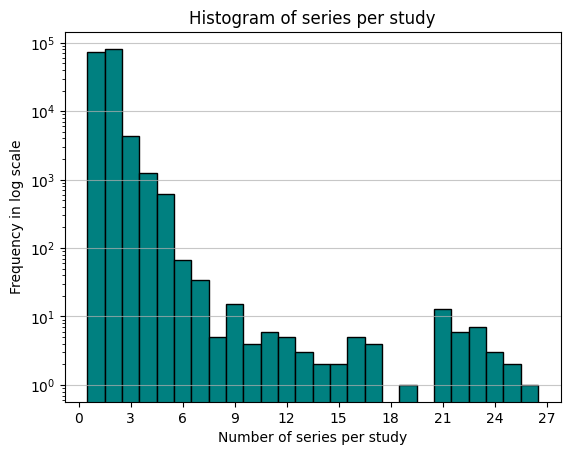

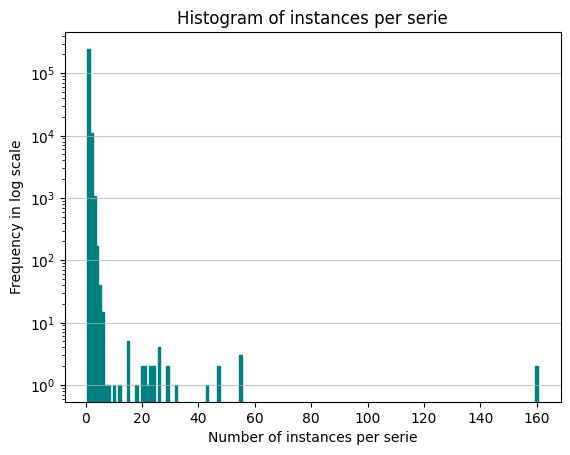

In [6]:
# %%script echo "Don't analyse dataset"

# # Path to dummy dataset for test purposes
# DS_PATH = "/share/data/paulenka/dataset_ReXGradient-160K/dataset/example"


def analyse_data(path=DS_PATH):
    """ Analyse ReXGradient-160K dataset """
    
    # series = 
    # instances = 

    indices = 0  # number of ID
    accession_per_id = []  # histogram of AccessionNumber cases per ID
    studies_per_accession = []  # histogram of studies per AccessionNumber
    series_per_study = []  # histogram of series per study
    instances_per_serie = []  # histogram of instances per serie
    instances_without_png = []  # list of instances without PNG files
    png_without_caption = []  # list of PNG files without caption
    png_number = 0  # number of PNG files

    # Get the initial count of separators in the base path
    # We use abspath to ensure the count is consistent
    start_path = os.path.abspath(path)
    base_depth = start_path.count(os.sep)

    # Walk through dataset
    for root, dirs, files in os.walk(path):
        # Calculate current depth relative to start_path
        current_depth = root.count(os.sep) - base_depth

        match current_depth:  # depth of directories tree
            case 0:
                indices = len(dirs)
            case 1:
                accession_per_id.append(len(dirs))
            case 3:
                studies_per_accession.append(len(dirs))
            case 5:
                series_per_study.append(len(dirs))
            case 7:
                num = len(files)
                instances_per_serie.append(num)

                # Search for instances without PNG files
                if num == 0:
                    instances_without_png.append(root)

                # Search for PNG without description
                for file in files:
                    png_path = f"{root}/{file}"
                    if png_path in captions_train or \
                       png_path in captions_valid or \
                       png_path in captions_test:
                        png_number += 1
                    else:
                        png_without_caption.append(png_path)
    
    print(f"Number of indices in the dataset: {indices}")
    print(f"Number of AccessionNumber cases: {sum(accession_per_id)}")
    print(f"Number of studies: {sum(studies_per_accession)}")
    print(f"Number of series: {sum(series_per_study)}")
    print(f"Number of instances: {sum(instances_per_serie)}")
    print(f"Number of PNG files: {png_number}")
    print(f"There are {len(png_without_caption)} PNG without description.")
    print(f"There are {len(instances_without_png)} empty instances without PNG.")
    
    histogram(accession_per_id, title="Histogram of AccessionNumber cases per ID",
              xlabel="Number of AccessionNumber cases per ID",
              ylabel="Frequency in log scale", log=True)
    histogram(studies_per_accession, title="Histogram of studies per AccessionNumber",
              xlabel="Number of studies per AccessionNumber",
              ylabel="Frequency in log scale", log=True)
    histogram(series_per_study, title="Histogram of series per study",
              xlabel="Number of series per study",
              ylabel="Frequency in log scale", log=True)
    histogram(instances_per_serie, title="Histogram of instances per serie",
              xlabel="Number of instances per serie",
              ylabel="Frequency in log scale", log=True)


analyse_data()

In [6]:
%%script echo "ONLY for debug purposes"

# def make_it_small(c):
#     """ ONLY for debug purposes. Making very small dataset """
#     return dict(islice(c.items(), 500))  # leave 500 pairs


# captions_train = make_it_small(captions_train)
# captions_valid = make_it_small(captions_valid)
# captions_test  = make_it_small(captions_test)
# print(len(captions_train))

ONLY for debug purposes


In [7]:
def get_pandas_df(captions, csv_file, shuffle=True):
    """ Convert captions dictionary back to Pandas dataframe.
        It is OK to have multiple captions per image or vice versa.
        Multiple PNGs per one caption like image/text augmentation. """
    rows = []
    for key, value in captions.items():
        if isinstance(value, list):  # check if value is a list
            for caption in value:  # multiple captions per one image
                rows.append({"image": key, "caption": caption})
        elif isinstance(value, str):  # value is a string
            rows.append({"image": key, "caption": value})
        else:
            raise TypeError(f"The caption must be a list or a string. "
                            f"Caption type: {type(value)}")

    df = pd.DataFrame(rows)  # from dictionary to Pandas DataFrame
    if shuffle:
        df = df.sample(frac=1).reset_index(drop=True)  # randomly shuffle the rows
    df.to_csv(csv_file, index=False)  # OPTIONAL. Save data to CSV file
    return df


train_df = get_pandas_df(captions_train, f"{TEMP}/train.csv")
valid_df = get_pandas_df(captions_valid, f"{TEMP}/valid.csv")
test_df  = get_pandas_df(captions_test,  f"{TEMP}/test.csv")

## Creating the dataset class

`albumentations` library is faster than `torchvision`.

In [8]:
augment = alb.Compose([
    
    # use ShiftScaleRotate as alternative to Affine transform
    alb.Affine(
        scale=[0.9, 1.0],
        translate_percent=[-0.05, 0.05],
        rotate=[-20, 20],
        shear=[-5, 5],
        p=0.8,
    ),

])

# The optimal and generally accepted order is: Resize → Augment → Normalize

normalize = alb.Compose([
    alb.Normalize(  # convert [0, 65535] to [-1.0, 1.0]
        mean=[0.5],  # 1 channel in X-ray images
        std=[0.5],
        max_pixel_value=65535.0,  # for uint16 X-ray images
    ),
    ToTensorV2(),  # convert NumPy to PyTorch tensor
])

valid_tfms = alb.Compose([
    alb.Resize(224, 224),
    normalize,
])

train_tfms = alb.Compose([
    alb.Resize(224, 224),
    augment,
    normalize,    
])

In [9]:
tokenizer = hf.GPT2TokenizerFast.from_pretrained(DECODER)
# in GPT models, the pad tokens are the same as the eos tokens
tokenizer.pad_token = tokenizer.eos_token

print(f"Padding token: {tokenizer.pad_token}")
print(f"End of sentence token: {tokenizer.eos_token}")
print(tokenizer("hello ! this is a test caption ."))

Padding token: <|endoftext|>
End of sentence token: <|endoftext|>
{'input_ids': [31373, 5145, 428, 318, 257, 1332, 8305, 764], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1]}


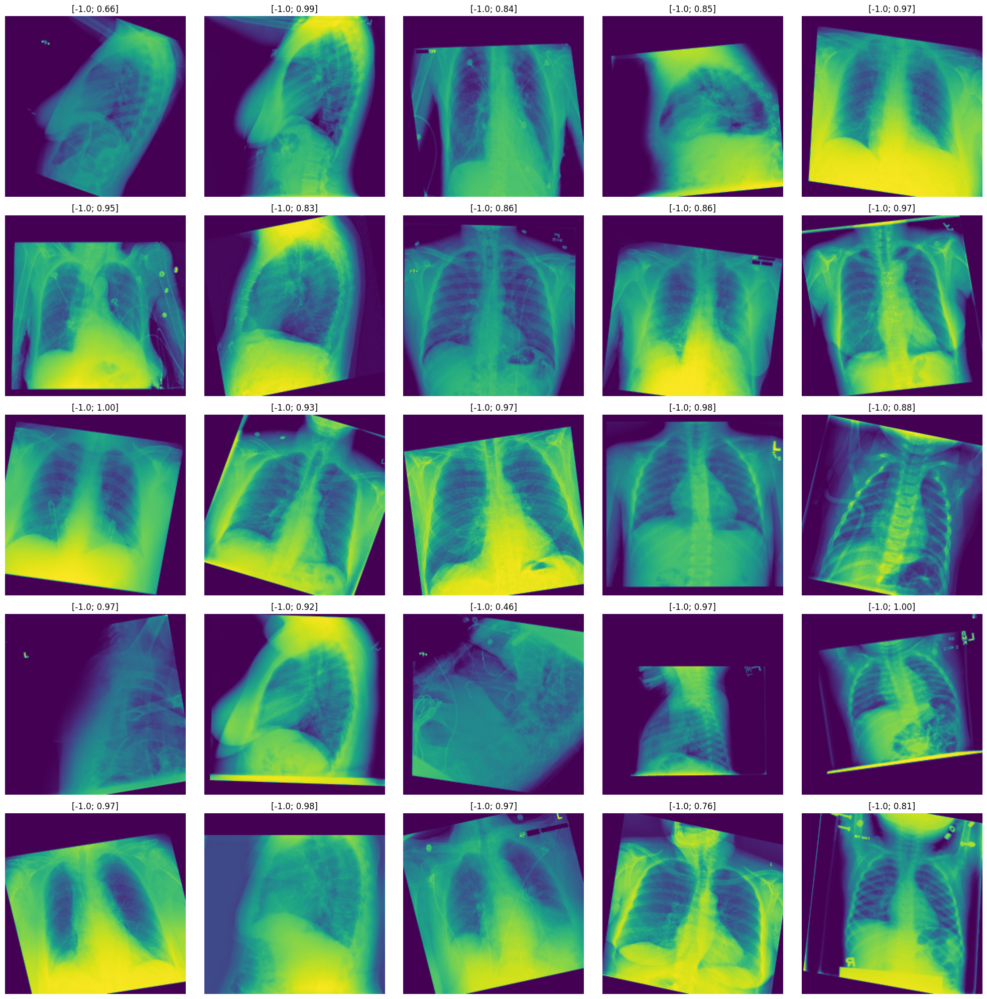

In [10]:
class Dataset:
    def __init__(self, pandas_df, transforms):
        self.df = pandas_df
        self.tfms = transforms

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        sample = self.df.iloc[idx, :]
        image = sample["image"]
        caption = sample["caption"]
        # process the image
        image = Image.open(image).convert("I;16")  # 16-bit integer grayscale image
        image = np.array(image)
        image = self.tfms(image=image)
        image = image["image"]
        # every caption ends with the end of sentence token: eos_token (50256 : <|endoftext|>)
        caption = f"{caption}{tokenizer.eos_token}"
        input_ids = tokenizer(caption, truncation=True)["input_ids"]
        # every caption is a sequence of tokens, and as it is causal language modeling where
        # the model predicts the next token, the labels are right shifted by 1 position
        labels = input_ids.copy()
        labels[:-1] = input_ids[1:]  # the labels are right shifted by 1 position
        return image, input_ids, labels


def show_batch_images(dataset, n_samples=25, index=0):
    cols = math.ceil(math.sqrt(n_samples))
    rows = math.ceil(n_samples / cols)
    width = 20  # inches
    height = math.ceil(width / cols) * rows

    fig, axes = plt.subplots(rows, cols, figsize=(width, height))

    for i in range(index, index + n_samples):
        # Every access to dataset[index] triggers random transforms
        img, _, _ = dataset[i]

        # Convert from Tensor (C, H, W) to Numpy (H, W, C)
        img = img.permute(1, 2, 0).numpy()

        ax = axes[i // cols, i % cols]
        ax.imshow(img, cmap="viridis")
        ax.set_title(f"[{img.min():.1f}; {img.max():.2f}]")
        ax.axis("off")
    
    plt.tight_layout()


train_ds = Dataset(train_df, train_tfms)
valid_ds = Dataset(valid_df, valid_tfms)
test_ds  = Dataset(test_df,  valid_tfms)

show_batch_images(train_ds)

## Custom collate function

* Collate function allows dynamic batches, eliminating the need for the model to handle sequences with a maximum length (`max_len`), which would simply be filled with placeholder (padding) tokens.
* Instead, each batch is filled according to the longest sequence in the batch itself.

In [11]:
def collate_fn(batch):
    images = [i[0] for i in batch]
    input_ids = [i[1] for i in batch]
    labels = [i[2] for i in batch]
    images = torch.stack(images, dim=0)
    # every caption is a sequence of tokens
    # every caption ends with the end of sentence token:
    # eos_token (50256 : <|endoftext|>)
    input_ids = tokenizer.pad(
        {"input_ids":input_ids},
        padding="longest",
        return_attention_mask=False,
        return_tensors="pt",
    )["input_ids"]
    # the labels are right shifted by 1 position
    labels = tokenizer.pad(
        {"input_ids":labels},
        padding="longest",
        return_attention_mask=False,
        return_tensors="pt",
    )["input_ids"]
    # in GPT models, the pad tokens are same as the eos tokens,
    # hence we also mask the pad tokens in the labels with -100
    # which are ignored by cross-entropy loss' default behaviour
    mask = (input_ids != tokenizer.pad_token_id).long()
    labels[mask==0] = -100
    return images, input_ids, labels

In [12]:
# Check it
dl = torch.utils.data.DataLoader(
    train_ds,
    shuffle=True,
    batch_size=2,
    collate_fn=collate_fn,
)
_, c, l = next(iter(dl))
print(c[0])
print(l[0])

tensor([  464, 26077, 41834,    11, 16957,   459,  1292,   290, 17570,   542,
         4662,   389,  1626,  3487,  7095,   290,  8245,    13,   383, 21726,
          389,  1598,   286,   281, 14352,  1429,    13,  1400,  3339,  1523,
          914, 15880,   393, 45105, 35258,    13,   383,   275,  1647, 41899,
          897,   318, 16572,    13, 50256, 50256, 50256, 50256, 50256, 50256,
        50256, 50256, 50256, 50256, 50256, 50256, 50256, 50256, 50256, 50256,
        50256, 50256])
tensor([26077, 41834,    11, 16957,   459,  1292,   290, 17570,   542,  4662,
          389,  1626,  3487,  7095,   290,  8245,    13,   383, 21726,   389,
         1598,   286,   281, 14352,  1429,    13,  1400,  3339,  1523,   914,
        15880,   393, 45105, 35258,    13,   383,   275,  1647, 41899,   897,
          318, 16572,    13, 50256,  -100,  -100,  -100,  -100,  -100,  -100,
         -100,  -100,  -100,  -100,  -100,  -100,  -100,  -100,  -100,  -100,
         -100,  -100])


## Model

[Model description is by the link](https://www.kaggle.com/code/shreydan/visiongpt2-image-captioning-pytorch?cellIds=21&kernelSessionId=264934616)

<img src="https://raw.githubusercontent.com/foobar167/junkyard/refs/heads/master/fine_tuning/data/VisionGPT2_architecture.jpg"
    alt="VisionGPT2 image captioning architecture" width="500"/>

<img src="https://raw.githubusercontent.com/foobar167/junkyard/refs/heads/master/fine_tuning/data/VisionGPT2Model_architecture.jpg"
    alt="Detailed architecture of the VisionGPT2 neural network" width="900"/>

   * GPT2 on its own is a **decoder-only model**. So it understands only textual context. To create a model which also understands image context and applies it to the text, we use cross-attention.
   * Cross Attention: It is the second attention layer of the decoder block as per the [classic transformer encoder-decoder model](https://ar5iv.labs.arxiv.org/html/1706.03762).
   * The query in cross-attention is the output of the previous causal attention layer in the decoder block. The key and value are the outputs of the corresponding encoder block i.e. the image context.
   * Since GPT2 doesn't have a cross-attention layer, [The author](https://www.kaggle.com/code/shreydan/visiongpt2-image-captioning-pytorch) ([link2](https://github.com/shreydan/VisionGPT2)) coded it as `GPT2CrossAttention` and made it a part of the usual decoder GPT2Block.
   * The encoder used is ViT-base with patch_size=16 grabbed from timm.
   * ViT and GPT2 are extremely compatible with each other. They have the same amount of depth i.e. encoder, decoder blocks respectively. They have the same hidden size of 768 as well. So you shouldn't have to pool the encoder outputs to match the decoder hidden size.
   * GPT2 code is based on [NanoGPT](https://github.com/karpathy/nanoGPT)


### Causal attention block

In [13]:
class GPT2Attention(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embed_dim = config.embed_dim
        self.n_heads = config.num_heads
        assertion_msg = "embedding dimension must be divisible by number of heads"
        assert self.embed_dim % self.n_heads == 0, assertion_msg
        self.head_size = self.embed_dim // self.n_heads
        self.seq_len = config.seq_len

        self.c_attn = nn.Linear(
            self.embed_dim,
            self.head_size * self.n_heads * 3,
            bias=True,
        )
        self.scale = self.head_size ** -0.5
        self.register_buffer(
            "mask",
            torch.tril(torch.ones(1, 1, self.seq_len, self.seq_len)),
        )
        self.c_proj = nn.Linear(self.embed_dim, self.embed_dim, bias=True)

        self.attn_dropout = nn.Dropout(config.attention_dropout)
        self.resid_dropout = nn.Dropout(config.residual_dropout)


    def forward(self, x):
        b, t, c = x.shape
        # q, k, v shape individually: batch_size * seq_len * embed_dim
        # we know that qk_t = q * k_t, where q = b*t*head_dim, k_t = b*head_dim*t
        q, k, v = self.c_attn(x).chunk(3, dim=-1)
        # batch * n_heads * seq_len * head_dim
        q = q.view(b, t, self.n_heads, self.head_size).permute(0, 2, 1, 3)
        k = k.view(b, t, self.n_heads, self.head_size).permute(0, 2, 1, 3)
        v = v.view(b, t, self.n_heads, self.head_size).permute(0, 2, 1, 3)

        qk_t = (q@k.transpose(-2, -1)) * self.scale
        qk_t = qk_t.masked_fill(
            self.mask[:, :, :t, :t] == 0,
            float("-inf"),
        )
        qk_t = fn.softmax(qk_t, dim=-1)
        weights = self.attn_dropout(qk_t)

        attention = weights @ v  # batch * n_heads * t * head_size
        attention = attention.permute(0, 2, 1, 3).contiguous().view(b, t, c)  # batch*t*embed_dim

        out = self.c_proj(attention)
        out = self.resid_dropout(out)

        return out

### Cross attention block

Notice that parameters are initialized with `mean=0` and `std=0.02`. This is an OpenAI trick they used while training GPT2 as well.

In [14]:
class GPT2CrossAttention(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embed_dim = config.embed_dim
        self.n_heads = config.num_heads
        assertion_msg = "embedding dimension must be divisible by number of heads"
        assert self.embed_dim % self.n_heads == 0, assertion_msg
        self.head_size = self.embed_dim // self.n_heads
        self.seq_len = config.seq_len

        self.q = nn.Linear(self.embed_dim, self.embed_dim)
        self.k = nn.Linear(self.embed_dim, self.embed_dim)
        self.v = nn.Linear(self.embed_dim, self.embed_dim)

        self.scale = self.head_size ** -0.5

        self.c_proj = nn.Linear(self.embed_dim, self.embed_dim, bias=True)

        self.attn_dropout = nn.Dropout(config.attention_dropout)
        self.resid_dropout = nn.Dropout(config.residual_dropout)

        self.apply(self._init_weights)


    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            # mean=0 and std=0.02 is an OpenAI trick they used while training GPT2
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
            if module.bias is not None:
                torch.nn.init.zeros_(module.bias)


    def forward(self, q, k, v):
        b, t, c = q.shape

        q = self.q(q)
        k = self.k(k)
        v = self.v(v)

        # batch * n_heads * seq_len * head_dim
        q = q.view(b, q.size(1), self.n_heads, self.head_size).permute(0, 2, 1, 3)
        k = k.view(b, k.size(1), self.n_heads, self.head_size).permute(0, 2, 1, 3)
        v = v.view(b, v.size(1), self.n_heads, self.head_size).permute(0, 2, 1, 3)

        qk_t = (q@k.transpose(-2, -1)) * self.scale
        qk_t = fn.softmax(qk_t, dim=-1)
        weights = self.attn_dropout(qk_t)

        attention = weights @ v  # batch * n_heads * t * head_size
        attention = attention.permute(0, 2, 1, 3).contiguous().view(b, t, c)  # batch*t*embed_dim

        out = self.c_proj(attention)
        out = self.resid_dropout(out)

        return out

### Feed forward block

In [15]:
class GPT2MLP(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embed_dim = config.embed_dim
        self.mlp_ratio = config.mlp_ratio
        self.mlp_dropout = config.mlp_dropout

        self.c_fc = nn.Linear(self.embed_dim, self.embed_dim * self.mlp_ratio)
        self.act = nn.GELU()
        self.c_proj = nn.Linear(self.embed_dim * self.mlp_ratio, self.embed_dim)
        self.dropout = nn.Dropout(self.mlp_dropout)


    def forward(self, x):
        x = self.c_fc(x)
        x = self.act(x)
        x = self.c_proj(x)
        x = self.dropout(x)
        return x

### Decoder block

Decoder block with added cross-attention and pre-normalization.

In [16]:
class GPT2Block(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embed_dim = config.embed_dim

        self.ln_1 = nn.LayerNorm(self.embed_dim)
        self.ln_2 = nn.LayerNorm(self.embed_dim)
        self.ln_3 = nn.LayerNorm(self.embed_dim)

        self.attn = GPT2Attention(config)
        self.cross_attn = GPT2CrossAttention(config)
        self.mlp = GPT2MLP(config)


    def forward(self, x, enc_out):
        # Use `x=x+y`. Do not use `x+=y`, because it doesn't work.
        # x+= self.attn(self.ln_1(x))  # it does not work for PyTorch
        x = x + self.attn(self.ln_1(x))
        x = x + self.cross_attn(self.ln_2(x), enc_out, enc_out)
        x = x + self.mlp(self.ln_3(x))
        return x

### The main model


   * Creating ViT model via `timm` library.
   * Added embedding code and right forward pass for the ViT model as per [their code](https://github.com/huggingface/pytorch-image-models/blob/main/timm/models/vision_transformer.py).
   * Each encoder output is passed to the decoder input and to the next encoder input as well. (see the picture)
   * The final decoder outputs are passed through a head block to generate logits as per the vocab size.
   * The loss function is calculated using cross-entropy if labels are present; otherwise, the logits for the last token in the generation sequence are returned.
   * Variable `pretrained_layers_trainable`: freezes/unfreezes ViT and GPT2 pretrained layers.
   * Variable `unfreeze_gpt_layers`: unfreezes GPT2 layers only.
   * Variable `from_pretrained`: loads GPT2 weights via Huggingface GPT2.
   * Variable `generate`: generates caption, sampling via `torch.multinomial` or deterministic via `argmax` with `temperature` control.

In [17]:
class VisionGPT2Model(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.config = config

        # Creating ViT model via timm library. Input channels == 1
        vit = timm.create_model(ENCODER, pretrained=True, num_classes=0, in_chans=1)
        self.patch_embed = vit.patch_embed
        num_patches = self.patch_embed.num_patches

        self.cls_token = vit.cls_token
        embed_len = num_patches + vit.num_prefix_tokens
        self.pos_embed = vit.pos_embed
        self.pos_drop = nn.Dropout(p=0.0)

        self.blocks = nn.ModuleList([vit.blocks[i] for i in range(config.depth)])

        self.transformer = nn.ModuleDict(dict(
            wte = nn.Embedding(config.vocab_size, config.embed_dim),
            wpe = nn.Embedding(config.seq_len, config.embed_dim),
            drop = nn.Dropout(config.emb_dropout),
            h = nn.ModuleList([GPT2Block(config) for _ in range(config.depth)]),
            ln_f = nn.LayerNorm(config.embed_dim),
        ))
        self.lm_head = nn.Linear(config.embed_dim, config.vocab_size, bias=False)
        self.transformer.wte.weight = self.lm_head.weight


    def _pos_embed(self, x):
        x = torch.cat((self.cls_token.expand(x.shape[0], -1, -1), x), dim=1)
        x = x + self.pos_embed
        return self.pos_drop(x)


    def pretrained_layers_trainable(self, trainable=False):
        """ Freezes and unfreezes ViT and GPT2 pretrained layers """
        layers = [
            self.cls_token, self.patch_embed, self.pos_embed, self.blocks,
            self.transformer.wte, self.transformer.wpe,
            self.transformer.ln_f, self.lm_head,
        ]

        gpt_layers = [
            [
                self.transformer.h[i].ln_1, self.transformer.h[i].ln_2,
                self.transformer.h[i].attn, self.transformer.h[i].mlp,
            ] for i in range(self.config.depth)
        ]

        for l in gpt_layers:
            layers.extend(l)

        for layer in layers:
            if not isinstance(layer, nn.Parameter):
                for p in layer.parameters():
                    p.requires_grad = trainable
            else:
                layer.requires_grad = trainable

        total_frozen_params = sum([p.numel() for p in self.parameters() if not p.requires_grad])
        print(f"{total_frozen_params=}")


    def unfreeze_gpt_layers(self, ):
        """ Unfreezes GPT2 layers only """
        gpt_layers = [
            [
                self.transformer.h[i].ln_1, self.transformer.h[i].ln_2,
                self.transformer.h[i].attn, self.transformer.h[i].mlp,
            ] for i in range(self.config.depth)
        ]

        flatten = []
        for l in gpt_layers:
            flatten.extend(l)

        for layer in flatten:
            if not isinstance(layer, nn.Parameter):
                for p in layer.parameters():
                    p.requires_grad = True
            else:
                layer.requires_grad = True


    @classmethod
    def from_pretrained(self, config):
        """ Loads GPT2 weights via Huggingface GPT2 """
        model = VisionGPT2Model(config)
        sd = model.state_dict()
        keys = sd.keys()
        ignore_matches = [
            "blocks.", "cross_attn.", "ln_3", "cls_token",
            "pos_embed", "patch_embed.", ".attn.mask",
        ]
        vit_keys = [key for key in keys if any(match in key for match in ignore_matches)]
        gpt_keys = [key for key in keys if key not in vit_keys]

        gpt2_small = hf.GPT2LMHeadModel.from_pretrained(DECODER)
        sd_hf = gpt2_small.state_dict()
        hf_keys = sd_hf.keys()
        hf_keys = [k for k in hf_keys if not k.endswith(".attn.masked_bias")]
        hf_keys = [k for k in hf_keys if not k.endswith(".attn.bias")]
        transposed = ["attn.c_attn.weight", "attn.c_proj.weight",
                      "mlp.c_fc.weight", "mlp.c_proj.weight",]

        for k in hf_keys:
            if any(match in k for match in ignore_matches):
                continue
            if any(k.endswith(w) for w in transposed):
                assert sd_hf[k].shape[::-1] == sd[k].shape
                with torch.no_grad():
                    sd[k].copy_(sd_hf[k].t())
            else:
                assert sd_hf[k].shape == sd[k].shape
                with torch.no_grad():
                    sd[k].copy_(sd_hf[k])

        model.load_state_dict(sd)
        return model


    def forward(self, image, input_ids, labels=None):
        image = self.patch_embed(image)
        image = self._pos_embed(image)

        token_embeddings = self.transformer.wte(input_ids)  # batch * seq_len
        pos_embs = torch.arange(0, input_ids.size(1)).to(input_ids.device)
        positional_embeddings = self.transformer.wpe(pos_embs)
        input_ids = self.transformer.drop(token_embeddings + positional_embeddings)

        for i in range(self.config.depth):
            image = self.blocks[i](image)
            input_ids = self.transformer.h[i](input_ids, image)

        input_ids = self.transformer.ln_f(input_ids)

        # The loss function is calculated using cross-entropy if labels are present;
        # otherwise, the logits for the last token in the generation sequence are returned.
        if labels is not None:
            lm_logits = self.lm_head(input_ids)
            loss = fn.cross_entropy(lm_logits.view(-1, lm_logits.shape[-1]), labels.view(-1))
            return loss

        lm_logits = self.lm_head(input_ids[:, [-1], :])
        return lm_logits


    def generate(self, image, sequence,
                 max_tokens=MAX_TOKENS,
                 temperature=1.0, deterministic=False):
        """ Generates caption, sampling via torch.multinomial
            or deterministic via argmax with temperature control. """
        for _ in range(max_tokens):
            out = self(image, sequence)
            out = out[:, -1, :] / temperature
            probs = fn.softmax(out, dim=-1)
            if deterministic:
                next_token = torch.argmax(probs, dim=-1, keepdim=True)
            else:
                next_token = torch.multinomial(probs, num_samples=1)
            sequence = torch.cat([sequence, next_token], dim=1)
            if next_token.item() == tokenizer.eos_token_id:
                break

        return sequence.cpu().flatten()

## Training

   * The pretrained layers are initially frozen, because [author](https://www.kaggle.com/code/shreydan/visiongpt2-image-captioning-pytorch) trains the cross attention layers first.
   * In the following epochs, GPT2 is unfreezed and trained.
   * In the final few epochs, the ViT is unfreezed as well.

<br/>

   * Optimizer: Adam
   * Scheduler: OneCycleLR
   * Mixed-precision fp16 training with autocast and grad-scaler in torch
   * Metrics: cross-entropy loss and perplexity = e^loss, both the lower the better
   * Best model is saved based on validation perplexity and the same is loaded while generating captions

GPT2 generally requires context before generating anything, since for image captioning we can't really provide an initial context except the image itself, the initial context we provide to GPT is just `[50256]` i.e `<|endoftext|>` which is also the beginning of sentence token in GPT. For other models such as OPT it is `</s>`. This one token acts as the initial context.

Training time for GPU Tesla V100-PCIE-16GB and ReXGradient-160K dataset: 1 hour 10 min per epoch; 8 epochs took around 9 hours to train.

In [18]:
class Trainer:
    def __init__(self, model_config, train_config, dls):
        self.train_config = train_config
        self.model_config = model_config
        self.device = self.train_config.device

        self.model = VisionGPT2Model.from_pretrained(model_config).to(self.device)
        self.model.pretrained_layers_trainable(trainable=False)

        trainable_parameters = sum([p.numel() for p in self.model.parameters() if p.requires_grad])
        print("trainable parameters:", trainable_parameters)

        self.tokenizer = hf.GPT2TokenizerFast.from_pretrained("gpt2")
        self.tokenizer.pad_token = self.tokenizer.eos_token

        self.scaler = torch.amp.GradScaler(self.device)

        self.train_dl, self.valid_dl, self.test_dl = dls

        total_steps = len(self.train_dl)

        self.optim = torch.optim.Adam(self.model.parameters(), lr=self.train_config.lr / 25.0)
        self.sched = torch.optim.lr_scheduler.OneCycleLR(
            self.optim,
            max_lr=self.train_config.lr,
            epochs=self.train_config.epochs,
            steps_per_epoch=total_steps,
        )
        self.batch_losses = list()

        # self.sched = hf.get_linear_schedule_with_warmup(
        #     self.optim,
        #     num_warmup_steps=0,
        #     num_training_steps=total_steps,
        # )

        self.metrics = pd.DataFrame()
        self.metrics[["train_loss", "train_perplexity",
                      "valid_loss", "valid_perplexity",]] = None

        self.gen_tfms = alb.Compose([
            alb.Resize(224, 224),
            alb.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
            ToTensorV2(),
        ])


    def save_model(self, ):
        os.makedirs(self.train_config.model_path, exist_ok=True)
        sd = self.model.state_dict()
        torch.save(sd, f"{self.train_config.model_path}/captioner.pt")


    def load_best_model(self, ):
        sd = torch.load(f"{self.train_config.model_path}/captioner.pt")
        self.model.load_state_dict(sd)


    def train_one_epoch(self, epoch):
        prog = tqdm(self.train_dl, total=len(self.train_dl))
        running_loss = 0.0

        for image, input_ids, labels in prog:
            with torch.autocast(self.device, dtype=torch.float16):
                image = image.to(self.device)
                input_ids = input_ids.to(self.device)
                labels = labels.to(self.device)

                loss = self.model(image, input_ids, labels)

                self.scaler.scale(loss).backward()
                self.scaler.step(self.optim)
                self.scaler.update()
                self.sched.step()
                self.optim.zero_grad(set_to_none=True)

                running_loss += loss.item()
                self.batch_losses.append(loss.item())

                prog.set_description(f"train loss: {loss.item():.3f}")

            # clear memory
            del image, input_ids, labels, loss

        train_loss = running_loss / len(self.train_dl)
        train_pxp = np.exp(train_loss)

        self.metrics.loc[epoch, ["train_loss", "train_perplexity"]] = (train_loss, train_pxp)


    @torch.no_grad()
    def run_one_epoch(self, dl, msg="loss"):
        total = len(dl)
        prog = tqdm(dl, total=total)
        running_loss = 0.0

        for image, input_ids, labels in prog:
            with torch.autocast(self.device):
                image = image.to(self.device)
                input_ids = input_ids.to(self.device)
                labels = labels.to(self.device)

                loss = self.model(image, input_ids, labels)
                running_loss += loss.item()

                prog.set_description(f"{msg}: {loss.item():.3f}")

            # clear memory
            del image, input_ids, labels, loss

        loss = running_loss / total
        pxp = np.exp(loss)

        return loss, pxp


    @torch.no_grad()
    def test(self, ):
        loss, pxp = self.run_one_epoch(dl=self.test_dl, msg="test loss")
        return loss, pxp


    @torch.no_grad()
    def valid(self, epoch):
        loss, pxp = self.run_one_epoch(dl=self.valid_dl, msg="valid loss")
        self.metrics.loc[epoch, ["valid_loss", "valid_perplexity"]] = (loss, pxp)
        return pxp


    def clean(self, ):
        gc.collect()
        torch.cuda.empty_cache()


    def fit(self, ):
        best_pxp = 1e9
        best_epoch = -1
        prog = tqdm(range(self.train_config.epochs))

        for epoch in prog:
            if epoch == self.train_config.freeze_epochs_gpt:
                self.model.unfreeze_gpt_layers()
                print("unfreezing GPT2 entirely...")

            if epoch == self.train_config.freeze_epochs_all:
                self.model.pretrained_layers_trainable(trainable=True)
                print("unfreezing ViT and GPT2 pretrained layers...")

            self.model.train()
            prog.set_description("training")
            self.train_one_epoch(epoch)
            self.clean()

            self.model.eval()
            prog.set_description("validating")
            pxp = self.valid(epoch)
            self.clean()

            print(self.metrics.tail(1))

            if pxp < best_pxp:
                best_pxp = pxp
                best_epoch = epoch
                print("saving best model...")
                self.save_model()

        return {
            "best_perplexity": best_pxp,
            "best_epoch": best_epoch,
        }


    @torch.no_grad()
    def generate_caption(self, path, max_tokens=MAX_TOKENS,
                         temperature=1.0, deterministic=False):
        self.model.eval()

        if path.startswith("https://"):  # download from the Internet
            reply = requests.get(path)  # request to URL
            image = BytesIO(reply.content)  # io.BytesIO memory buffer
            image = Image.open(image).convert("I;16")  # open PIL image
        elif path.endswith(".nii.gz"):  # NIfTI image
            image = nib.load(path)  # open NIfTI image
            image = image.get_fdata()  # convert to NumPy
            image = image[:, :, 0]  # (W,H,1) to (W,H)
            image = np.rot90(image)  # rotate 90 degrees counter clockwise
            image = Image.fromarray(image)  # from NumPy to PIL
        else:
            image = Image.open(path).convert("I;16")  # should be [0, 65535]

        # print(image.mode)
        image = image.resize((224, 224), resample=Image.BILINEAR)  # resize PIL image
        image = np.array(image)  # from PIL to NumPy
        image = (image - image.min()) / (image.max() - image.min())  # normalize to [0.0, 1.0]
        image = image * 2.0 - 1.0  # convert [0.0, 1.0] to [-1.0, 1.0]
        image = torch.from_numpy(image.copy()).float()  # convert NumPy to PyTorch tensor
        image = image.unsqueeze(0).unsqueeze(0).to(DEVICE)  # (H,W) to (1,1,H,W)

        sequence = torch.ones(1, 1).to(device=self.device).long() * self.tokenizer.bos_token_id

        caption = self.model.generate(
            image,
            sequence,
            max_tokens=max_tokens,
            temperature=temperature,
            deterministic=deterministic,
        )
        caption = self.tokenizer.decode(caption.numpy(), skip_special_tokens=True)

        return caption

In [19]:
model_config = SimpleNamespace(
    vocab_size = 50_257,
    embed_dim = 768,
    num_heads = 12,
    seq_len = 1024,
    depth = 12,
    attention_dropout = 0.1,
    residual_dropout = 0.1,
    mlp_ratio = 4,
    mlp_dropout = 0.1,
    emb_dropout = 0.1,
)

# 8 epochs in total
# (0,1,2,3,4) --> first 5 epochs to train GPT2 attention blocks only
# (5,6) --> unfreeze GPT2 and train for +2 epochs
# (7) --> unfreeze ViT and train all weights for +1 epochs
train_config = SimpleNamespace(
    epochs = 8,
    freeze_epochs_gpt = 5,
    freeze_epochs_all = 7,
    lr = 1e-4,
    device = DEVICE,
    model_path = f"{TEMP}/caption_model",
    batch_size = 12,  # 32
)

train_dl = torch.utils.data.DataLoader(
    train_ds,
    batch_size=train_config.batch_size,
    shuffle=True,
    pin_memory=True,
    num_workers=NUM_WORKERS,
    persistent_workers=True,
    collate_fn=collate_fn,
)

valid_dl = torch.utils.data.DataLoader(
    valid_ds,
    batch_size=train_config.batch_size,
    shuffle=False,
    pin_memory=True,
    num_workers=NUM_WORKERS,
    persistent_workers=True,
    collate_fn=collate_fn,
)

test_dl = torch.utils.data.DataLoader(
    test_ds,
    batch_size=train_config.batch_size,
    shuffle=False,
    pin_memory=True,
    num_workers=NUM_WORKERS,
    persistent_workers=True,
    collate_fn=collate_fn,
)

trainer = Trainer(model_config, train_config, (train_dl, valid_dl, test_dl))

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

GPT2LMHeadModel LOAD REPORT from: gpt2
Key                  | Status     |  | 
---------------------+------------+--+-
h.{0...11}.attn.bias | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


total_frozen_params=209843712
trainable parameters: 28366848


In [ ]:
os.environ["TOKENIZERS_PARALLELISM"] = "false"  # remove multiple warnings (or "true")

# # If a previous model exists, load it.
# model_path = f"{train_config.model_path}/captioner.pt"
# if os.path.isfile(model_path):
#     print(f"Load previous model from '{model_path}'")
#     trainer.load_best_model()

trainer.fit()

## Results
Validation loss for 8,000 images of [Flickr8k](https://github.com/awsaf49/flickr-dataset) dataset is **2.30**.

Validation loss for 330,000 images of [MS-COCO](https://huggingface.co/datasets/HuggingFaceM4/COCO) dataset [is **2.09**](https://github.com/shreydan/VisionGPT2?tab=readme-ov-file#results).

Test loss for 238,968 images of [ReXGradient-160K](https://huggingface.co/datasets/rajpurkarlab/ReXGradient-160K) dataset: **0.87**

<img src="https://raw.githubusercontent.com/foobar167/junkyard/refs/heads/master/fine_tuning/data/2026-02-08_CXR_captions_results.jpg"
    alt="Results" width="400"/>

In [24]:
loss, pxp = trainer.test()  # test the model after training

print(f"\nTest loss: {loss:.3f}. Test perplexity: {pxp:.3f}\n")  # show testing results

display(trainer.metrics)  # show training results

  0%|          | 0/2129 [00:01<?, ?it/s]


Test loss: 0.866. Test perplexity: 2.378



,train_loss,train_perplexity,valid_loss,valid_perplexity
0,3.685468,39.86379,1.90688,6.732055
1,1.803006,6.067859,1.39041,4.016495
2,1.446493,4.24819,1.208489,3.348422
3,1.306983,3.695007,1.139881,3.126395
4,1.229025,3.417894,1.090929,2.977038
5,1.063362,2.896091,0.92159,2.513282
6,0.920772,2.511228,0.872368,2.392569
7,0.855523,2.352605,0.842637,2.322483


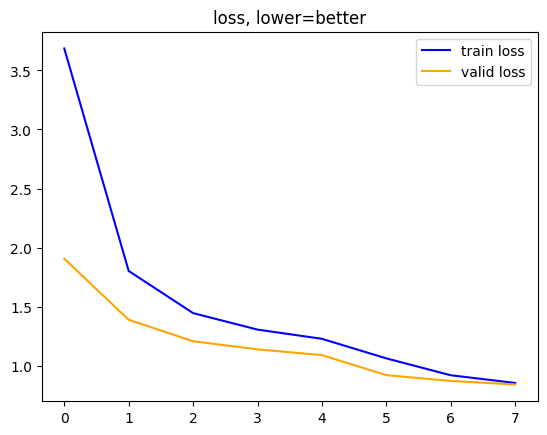

In [25]:
plt.plot(trainer.metrics["train_loss"], color="blue",   label="train loss")
plt.plot(trainer.metrics["valid_loss"], color="orange", label="valid loss")
plt.title("loss, lower=better")
plt.legend()
plt.show()

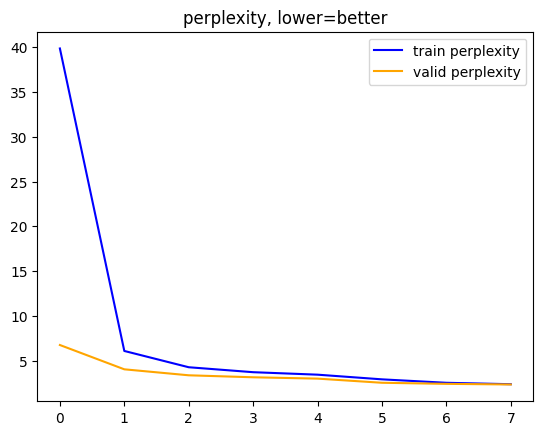

In [26]:
plt.plot(trainer.metrics["train_perplexity"], color="blue",   label="train perplexity")
plt.plot(trainer.metrics["valid_perplexity"], color="orange", label="valid perplexity")
plt.title("perplexity, lower=better")
plt.legend()
plt.show()

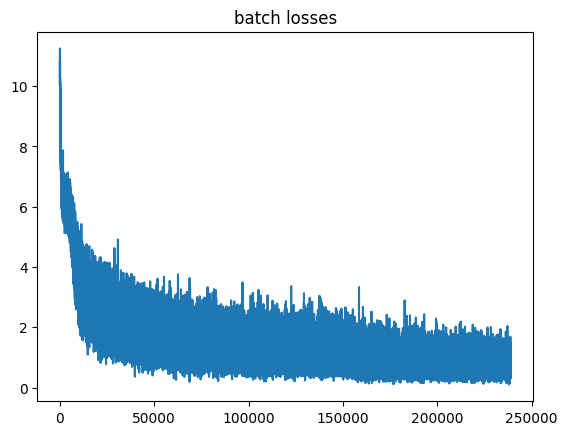

In [27]:
plt.plot(trainer.batch_losses)
plt.title("batch losses")
plt.show()

## Predictions

In [20]:
trainer.load_best_model()

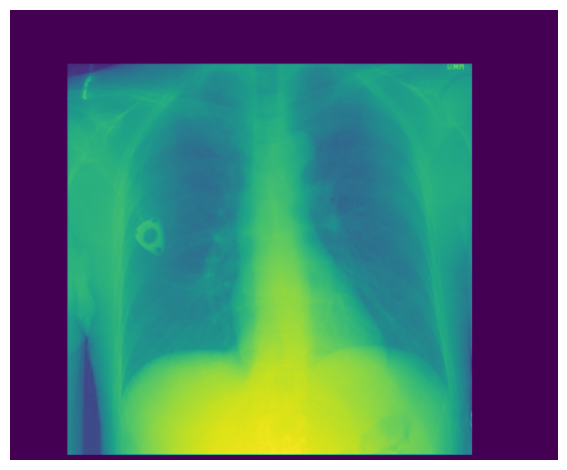

Actual caption:
	The right subclavian Port-A-Cath is in good position. The tip is in the distal SVC approximately 1 cm above the cavoatrial junction. The cardiac silhouette, mediastinal and hilar contours are normal and stable. The lungs are clear. No pulmonary nodules. No pneumothorax. The bony thorax is intact.


Temperature = 1.0, deterministic = True:
	 exam is limited by patient body habitus. The lungs are clear. The heart and pulmonary vessels are normal. The bony and mediastinal structures are unremarkable. There is no effusion.

Temperature = 0.5, deterministic = False:
	 examination is limited secondary to patient body habitus. The lungs are clear. The cardiovascular structures are unremarkable.

Temperature = 1.0, deterministic = False:
	 transverse mass in the right upper lobe is again seen and appears unchanged. Lungs are clear otherwise. Heart size and pulmonary vascularity are normal. No adenopathy. No bone lesions.

Temperature = 1.5, deterministic = False:
	 Marked repr

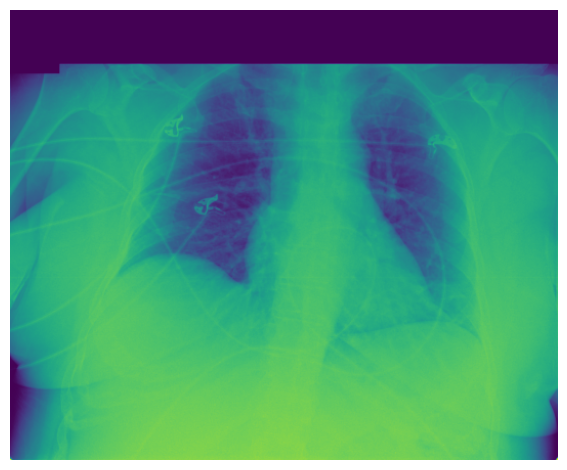

Actual caption:
	Bilateral rib fractures. Midline trachea. Normal heart size and mediastinal contours. No pleural effusion or pneumothorax. Low lung volumes with resultant pulmonary interstitial prominence. Mild left base air space disease which is likely atelectasis. Right hemidiaphragm elevation.


Temperature = 1.0, deterministic = True:
	 right IJ central venous catheter tip is in the superior vena cava. No pneumothorax. The heart size and mediastinal contours are within normal limits. Both lungs

Temperature = 0.5, deterministic = False:
	 lateral view of the chest shows the lungs to be clear. The heart is within normal limits in size. No bony abnormality is seen.

Temperature = 1.0, deterministic = False:
	 low volumes with mild bibasilar atelectasis. No focal pneumonia, edema, effusion or pneumothorax.

Temperature = 1.5, deterministic = False:
	 right IJ hematoma noted through the right lung also again noted with dense/ growing, pneumoniaologically localized at the right lung b

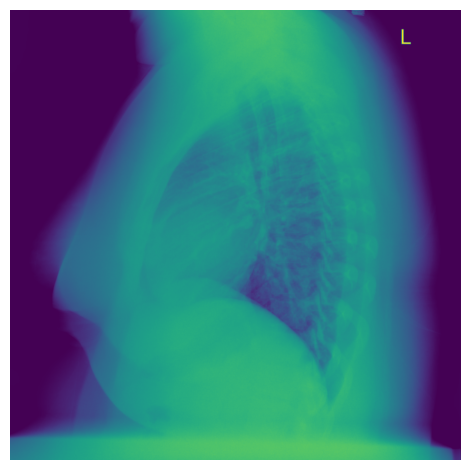

Actual caption:
	The lungs are clear. No adenopathy is seen. The heart is mildly enlarged. No bony abnormality is noted.


Temperature = 1.0, deterministic = True:
	 and lateral views of the chest show the lungs to be clear. The heart is within normal limits in size. No bony abnormality is seen.

Temperature = 0.5, deterministic = False:
	 lateral view is limited by motion artifact. The heart size and mediastinal contours are normal. The lungs are clear. There is no pleural effusion or pneumothorax. No acute

Temperature = 1.0, deterministic = False:
	 anterior chest wall soft tissue prominence bilaterally compatible with known mediastinal enlargement. Lungs are clear. No pneumothorax. No pleural effusion. Heart size normal. No acute

Temperature = 1.5, deterministic = False:
	 apex cannot be seen musically. Within the sternum arterial arteries she verified this interval imaged upper aneurysm to think this thoracic aneurysm over the 10th spinal



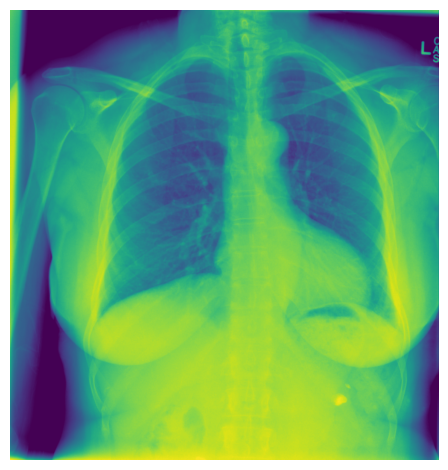

Actual caption:
	The heart size and mediastinal contours are within normal limits. No airspace consolidation. Nodular opacity in the right midlung measures 1.5 cm. This is indeterminate. The visualized skeletal structures are unremarkable.


Temperature = 1.0, deterministic = True:
	 lung fields are clear. No pneumonia, pneumothorax or pleural effusion is seen. Heart size is normal. No acute bony abnormalities are identified.

Temperature = 0.5, deterministic = False:
	 examination is limited by patient's large body habitus. The cardiopericardial silhouette is enlarged. The lungs are clear. There is no airspace disease. There is no pleural effusion

Temperature = 1.0, deterministic = False:
	 size is at the upper limits of normal. There is no effusion or edema. Vague linear opacity is suspected overlying the left lower lobe. Right lung is clear.

Temperature = 1.5, deterministic = False:
	 appearance marks concern for irregular physiologic bypass by meconium imaging marker Non standard

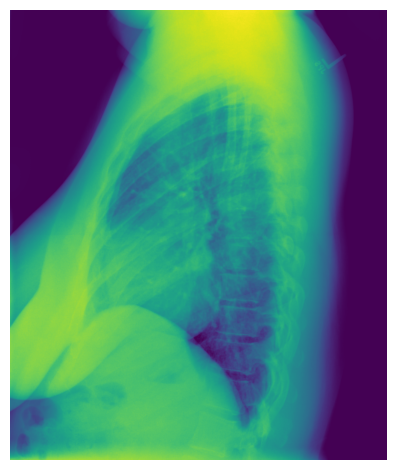

Actual caption:
	Heart borderline enlarged. No congestive heart failure or pleural fluid. Lungs clear. Osseous structures intact.


Temperature = 1.0, deterministic = True:
	 and lateral views of the chest show the lungs to be clear. The heart is within normal limits in size. No bony abnormality is seen.

Temperature = 0.5, deterministic = False:
	 the heart size and vascularity are normal and the lungs are clear. No significant bony abnormality.

Temperature = 1.0, deterministic = False:
	 average age is 2181. This is most likely secondary to a low lung volumes. Heart and mediastinal contours are within normal limits. No focal opacities or effusions. No acute

Temperature = 1.5, deterministic = False:
	 rounded blunting 3S obstruction decreased since of 8898 studies. Increased lung volumes with dilatation right upper lobe compatible with patchy infiltrative pulmonary infiltrate. No large pleural effusion identified



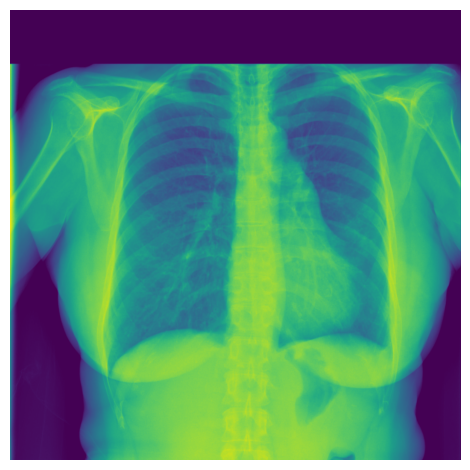

Actual caption:
	Mediastinum and hilar structures are normal. Lungs are clear. No pleural effusion or pneumothorax. Left base pleural parenchymal thickening consistent with scarring. No acute bony abnormality.


Temperature = 1.0, deterministic = True:
	 anterior chest wall soft tissue density is seen. The lungs are clear. The heart is within normal limits in size. No bony abnormality is seen.

Temperature = 0.5, deterministic = False:
	 and left ribs show no fracture or dislocation. There is a small metallic foreign body in the left upper quadrant. No other bony abnormality is seen.

Temperature = 1.0, deterministic = False:
	 heart size and mediastinal contours are within normal limits. Both lungs are clear. The visualized skeletal structures are unremarkable.

Temperature = 1.5, deterministic = False:
	 infiltrate at the left retrocardiac measures 9 prior nearly 6 months in a STUD. Centuryaginous sclerosis and degenerative formation 5 compliant with causing involving the suspected c

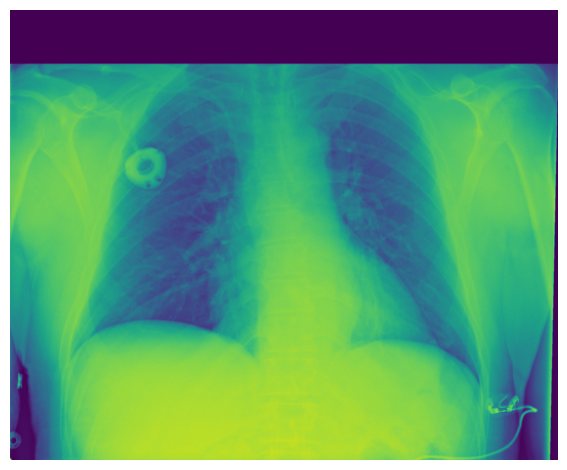

Actual caption:
	A right chest port catheter has been placed in the distal tip overlies the region of the superior cavoatrial junction. No evidence of postprocedural pneumothorax. The lungs are clear and the costophrenic sulci are sharp. Heart size is normal and pulmonary vasculature is normal caliber.


Temperature = 1.0, deterministic = True:
	 lung fields are clear. No pneumonia, pneumothorax or pleural effusion is seen. Heart size is normal. No acute bony abnormalities are identified.

Temperature = 0.5, deterministic = False:
	 lung fields are clear. No pneumonia, pneumothorax or pleural effusion is seen. Heart size is normal. No acute bony abnormalities are identified.

Temperature = 1.0, deterministic = False:
	 heart size and mediastinal contours are within normal limits. Both lungs are clear. No pneumothorax or pleural effusion is noted. The visualized skeletal structures are unremarkable.

Temperature = 1.5, deterministic = False:
	 redemonstration of newly identified parench

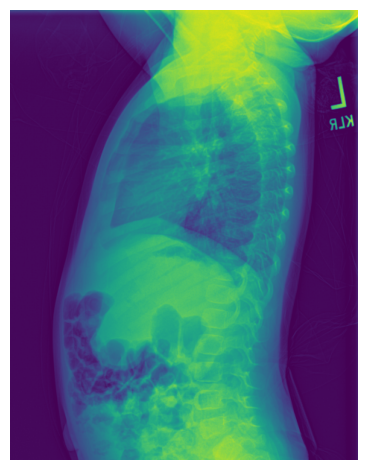

Actual caption:
	There is mild peribronchial thickening. No consolidation. The cardiothymic silhouette is normal. No pleural effusion or pneumothorax. No osseous abnormalities.


Temperature = 1.0, deterministic = True:
	 and lateral views of the chest demonstrate an unremarkable cardiac silhouette. No airspace disease, effusion, or pneumothorax. No acute bony abnormalities.

Temperature = 0.5, deterministic = False:
	 central airway thickening. No focal airspace consolidation or effusion. Cardiothymic silhouette is within normal limits. No pneumothorax.

Temperature = 1.0, deterministic = False:
	 pneumonia is seen in the right middle lobe. There is no evidence of pulmonary edema. No pleural fluid is seen. No acute bony abnormalities are identified. The heart size is normal.

Temperature = 1.5, deterministic = False:
	 feature of accromatous depression in the distal thymic fat by Abigastruct of the right amygdala are seen (arrow CT my hollow bones struck groin on scan arthropathy meas

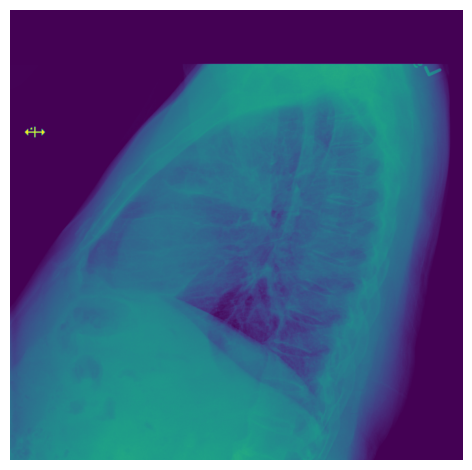

Actual caption:
	Again noted is fullness in left hilum compatible with the patient's known mass. Prominent interstitial densities in the left lung compared to the right have minimally changed. Heart and mediastinum are within normal limits and stable. Atherosclerotic calcifications at the aortic arch. Trachea is midline. Negative for pneumothorax. No pleural effusions.


Temperature = 1.0, deterministic = True:
	 mild cardiomegaly is noted. No acute infiltrate or pleural effusion. No pulmonary edema. Mild degenerative changes thoracic spine.

Temperature = 0.5, deterministic = False:
	 and lateral views of the chest demonstrate an unremarkable cardiac silhouette. No airspace disease, effusion, or pneumothorax. No acute bony abnormalities.

Temperature = 1.0, deterministic = False:
	 right lower lobe consolidation is present compatible with pneumonia. The remainder of the lungs are clear. No edema or pleural effusions. Atherosclerotic calcifications at the aortic arch.

Temperature = 1.

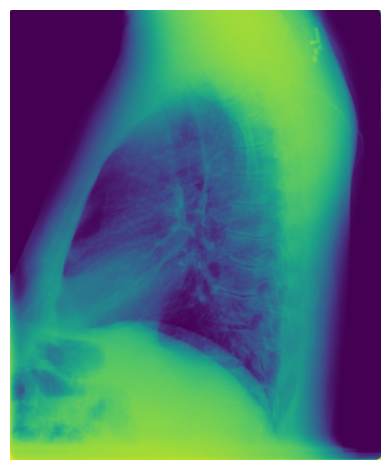

Actual caption:
	The cardiac silhouette, mediastinal and hilar contours are within normal limits. The lungs are clear. The bony thorax is intact.


Temperature = 1.0, deterministic = True:
	 and lateral views of the chest show the lungs to be clear. The heart is within normal limits in size. No bony abnormality is seen.

Temperature = 0.5, deterministic = False:
	 normal heart size. Normal mediastinal contour. No pneumothorax. No pleural effusion. No pulmonary edema. No acute consolidative airspace disease.

Temperature = 1.0, deterministic = False:
	 lower thoracic vertebral body heights diagnosed with a mild mediastinal widening. Cardiac and mediastinal contours appear normal. Right perihilar bronchitic air space disease borderline to

Temperature = 1.5, deterministic = False:
	 at 6551 hr, Thoracolumbar spondylosis with linear density seen medially the right heart border, Ill7. Nasogastric process is seen at REMADIFT sequences



In [81]:
num = 10
max_tokens = 40  # shorten the length of the answer
for i in range(num):
    test = test_df.sample(n=1).values[0]
    test_img, test_caption = test[0], test[1]

    gen_captions = []  # list of generated captions with hyperparameters

    t, det = 1.0, True
    caption = trainer.generate_caption(
        test_img, temperature=t, deterministic=det, max_tokens=max_tokens) 
    gen_captions.append([caption, t, det])

    temps = [0.5, 1.0, 1.5]  # temperatures
    for t in temps:
        det = False
        caption = trainer.generate_caption(
            test_img, temperature=t, deterministic=det, max_tokens=max_tokens)
        gen_captions.append([caption, t, det])

    # img = Image.open(test_img)
    img = Image.open(test_img).convert("I;16")  # 16-bit integer grayscale image

    plt.imshow(img, cmap="viridis")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    print(f"Actual caption:\n\t{test_caption}\n\n")
    for c in gen_captions:
        print(f"Temperature = {c[1]}, deterministic = {c[2]}:\n\t{c[0]}\n")

In [98]:
def get_key_value(captions, num):
    """ Get key-value pair from the dictionary """
    iterator = iter(captions.items())
    key_value = next(islice(iterator, num, num + 1), None)
    return key_value


def get_info(CSV, index):
    """ Get information from CSV file """
    df = pd.read_csv(CSV)
    row = df.iloc[index]  # get row by index from CSV file
    
    caption = str(row.Findings)  # get caption from "Findings" column
    
    # Process the row.id column with regular expression
    pattern = r"^p(.*?)_a(.*?)_s([\d.]+)$"  # lazy pattern (.*?)
    match = re.search(pattern, row.id)

    # Get path to the series folder
    path = f"{DS_PATH}/{match.group(1)}/{match.group(2)}/studies/{match.group(3)}/series"

    for root, dirs, files in os.walk(path):
        if files:
            # Return the full path of the first file found
            img_path = f"{root}/{files[0]}"
    
    return img_path, caption


def predict_captions(
    trainer, path,
    # temps=(0.5, 1.0, 1.5),  # tuple of temperatures
    temps=(0.5, ),  # tuple of temperatures
):
    """ Helper function for getting image captions from the Internet or from a file path """
    if path.startswith("https://"):  # download from the Internet
        reply = requests.get(path)
        img = Image.open(BytesIO(reply.content))
    elif path.endswith(".nii.gz"):  # open NIfTI image
        img = nib.load(path)
        img = img.get_fdata()  # convert to NumPy
        img = img[:, :, 0]  # (W,H,1) to (W,H)
        img = (img - img.min()) / (img.max() - img.min())  # normalize to [0.0, 1.0]
        img = (img * 65535).astype(np.uint16)  # convert to [0, 65535]
        img = np.rot90(img)  # rotate 90 degrees counter clockwise
        img = Image.fromarray(img)  # convert from NumPy to PIL
    else:  # from the file path
        img = Image.open(path)

    display(img)  # show image

    settings = []  # list of settings for responses
    settings.append((1.0, True))  # for det=True temperature has no effect
    for t in temps:
        settings.append((t, False))  # temperature-deterministic pairs

    responses = []  # list of responses
    for t, det in settings:
        gen_caption = trainer.generate_caption(path, temperature=t, deterministic=det)
        responses.append(f"t={t:.1f}; det={det}\n\t{gen_caption}")

    print(f"Generated captions:", *responses, sep="\n\t", end="\n")

Actual caption:
	There is cardiomegaly with pulmonary vascular congestion. There is interstitial edema diffusely. There is patchy airspace consolidation in the left lower lobe region. No adenopathy evident. No bone lesions.


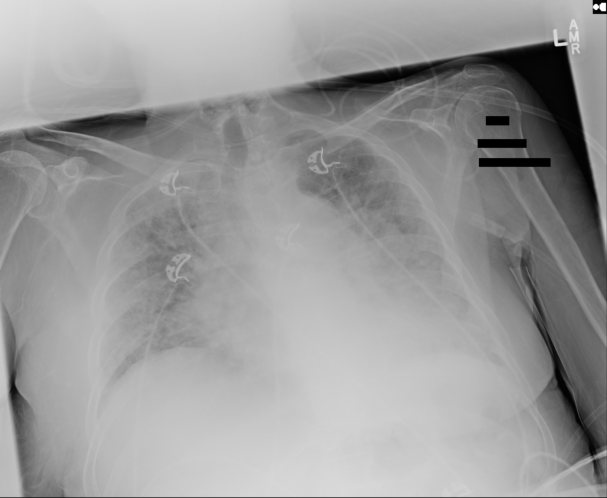

Generated captions:
	t=1.0; det=True
	 exam is limited by patient positioning. There is cardiomegaly. There is pulmonary vascular congestion. There is bilateral interstitial prominence. There is no pneumothorax. There is no significant pleural effusion.
	t=0.5; det=False
	 study is limited by the patient's large body habitus. The patient is rotated to the right. Tracheostomy tube is seen in good position. The lung volumes are low. There is mild pulmonary vascular congestion. The heart is enlarged but stable.
	t=1.0; det=False
	 current exam shows improved aeration. There still appear to be some pulmonary edema present. Prominent interstitial markings are again seen and are more prominent than in the prior exam. There are changes of COPD consistent with mild pulmonary edema.
	t=1.5; det=False
	 thoracic plasma urgent reversal may produce this in keeping with a history of ileus pathology with vascular tubeomediastinum. Low inspiratoryague vascular congestion apparentheter ventral device 

In [83]:
img_path, actual_caption = get_info(TEST_CSV, 2)
print("Actual caption:", actual_caption, sep="\n\t")
predict_captions(trainer, img_path)

Actual caption:
	An area of diffuse increased density projects within the RIGHT middle lobe. A small metallic density projects in the LEFT mid central hemithorax consistent with the patient's history of previous BB shot. No further focal regions of consolidation or focal infiltrates are appreciated. The cardiac silhouette and visualized bony skeleton are unremarkable.


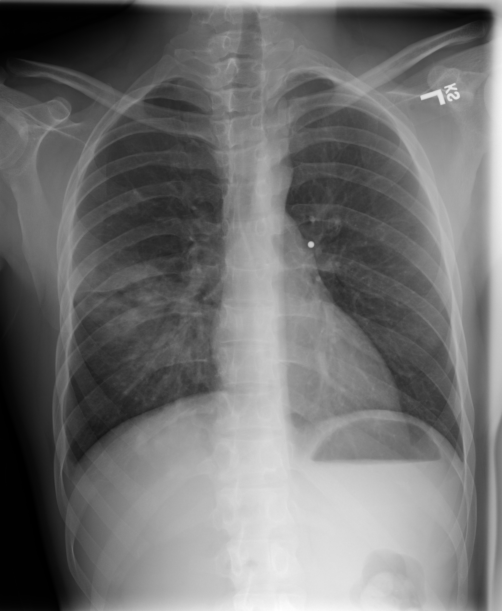

Generated captions:
	t=1.0; det=True
	 RIGHT lower lobe pneumonia is present. The LEFT lung is clear. The heart and pulmonary vessels are normal. The bony and mediastinal structures are unremarkable. There is no effusion. There is no pneumothorax or evidence of congestive failure.
	t=0.5; det=False
	 examination is limited by patient rotation. The cardiac silhouette, mediastinal and hilar contours are within normal limits. The lungs are clear. The bony thorax is intact.
	t=1.0; det=False
	 LEFT upper lobe consolidation has increased slight. This accounts for a possible pneumonia given the superior endplate specifically at the lung base. This could be an early infiltrate or pleural-based pneumonia. No evident effusion. No pneumothorax. Bilateral lower lung apical pleural scarring noted. Pulmonary vascular congestion is evident.
	t=1.5; det=False
	 [...] ectonodula resection visible within 5 below left cardiac left projectational median sternotomy wires present on) when able, appears gro

In [84]:
img_path, actual_caption = get_info(TEST_CSV, 19)
print("Actual caption:", actual_caption, sep="\n\t")
predict_captions(trainer, img_path)

Actual caption:
	UVC terminates over the high right atrium. Orogastric tube is appropriately positioned. Bowel gas pattern is normal. Lung bases are clear.


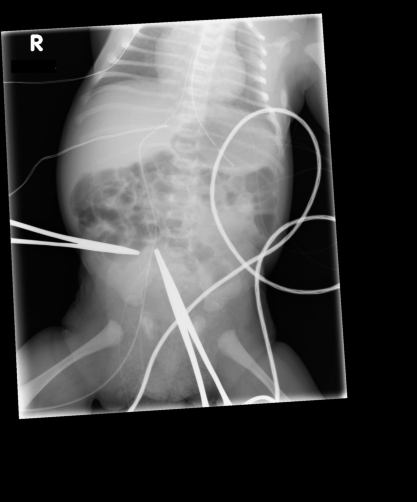

Generated captions:
	t=1.0; det=True
	 orogastric tube is in place with the tip in the stomach. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip is in the right atrium. The umbilical venous catheter tip
	t=0.5; det=False
	 orogastric tube is in place with tip in the region of the stomach. The lungs are clear. The bowel gas pattern is normal.
	t=1.0; det=False
	 Orogastric tube is in the stomach. Umbilical venous catheter is in the 

In [86]:
img_path, actual_caption = get_key_value(captions_test, 0)
print("Actual caption:", actual_caption, sep="\n\t")
predict_captions(trainer, img_path)

Actual caption:
	LLL pneumonia


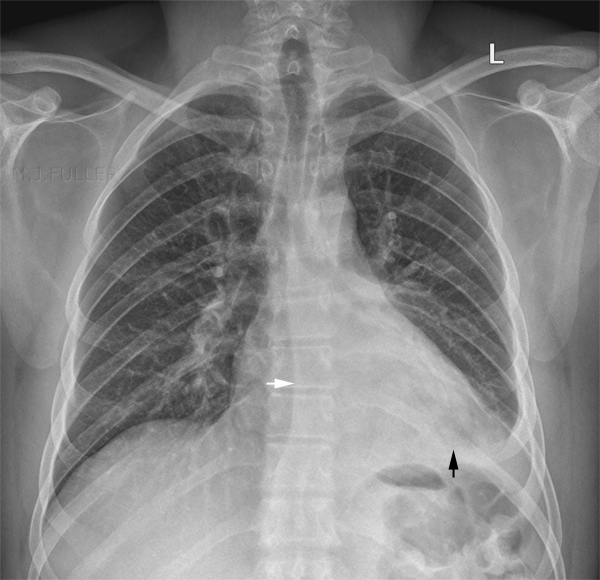

Generated captions:
	t=1.0; det=True
	 right IJ central venous catheter tip is in the superior vena cava. No pneumothorax. There is a small left pleural effusion. There is mild atelectasis at the left base. Lungs elsewhere clear. Heart size and pulmonary vascularity are normal. No adenopathy. No bone lesions.
	t=0.5; det=False
	 left jugular catheter is present with the tip in the SVC. No pneumothorax is seen. There is some basilar atelectasis present. There is no effusion.
	t=1.0; det=False
	 AP and lateral views of the chest. Large right pleural effusion with adjacent atelectasis. Minimal left pleural effusion and mild right basilar atelectasis. Allowing for lung volumes, heart size at the upper limits of normal. No pneumothorax.
	t=1.5; det=False
	 RIGHT apical clear bases noted. A loop recorder and evacuation device tube inapparent and recent cardiac surgery might have produced flattening on the study for better inspiration. Tip centered within normal size this carina situated at e

In [89]:
# URL: https://www.maimonidesem.org/blog/tag/pneumoni
path = "https://images.squarespace-cdn.com/content/v1/5b8645f7266c07b084eb29c7/1565979093438-NKEZOFQE345YUT6404VN/2a.jpeg?format=2500w"
print(f"Actual caption:\n\t"
      f"LLL pneumonia"
)
predict_captions(trainer, path)

Actual caption: tuberculosis


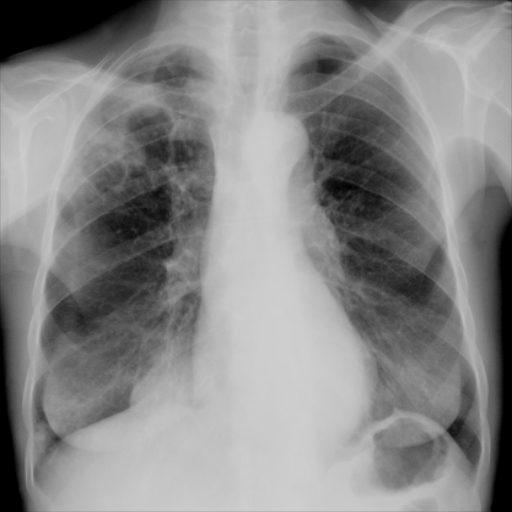

Generated captions:
	t=1.0; det=True
	 exam shows the lung fields to be clear. No pneumonia, pneumothorax or pleural effusion is seen. The heart size is normal. The mediastinal and osseous structures show no significant abnormalities.
	t=0.5; det=False
	 exam is degraded by patient body habitus. The heart is normal. There is no heart failure. The lungs are clear and there is no infiltrate or effusion.
	t=1.0; det=False
	 increased density in the right upper lobe most consistent with pneumonia. There may be subtle additional scattered nodular density in the right upper lung zone, otherwise the lungs are clear. The heart is not enlarged. The bones are osteopenic.
	t=1.5; det=False
	 this has outer audiomatosis is similar cardiomediastinal structures and ventricular system normal. 87 based valve complex on LEFT longer suspected. No convex RIGHT nipples noted due to noted situ but this cannot assumethec certify cy wouldlow STINDOS, symmetric pulmonary parenchymal lesions is indeterminate. 

In [90]:
path = "./pictures/665_1_32478.dcm_norm.png"
print("Actual caption: tuberculosis")
predict_captions(trainer, path)

Actual caption: tuberculosis


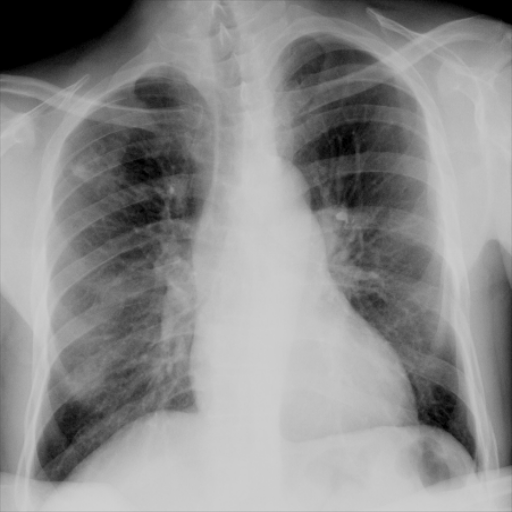

Generated captions:
	t=1.0; det=True
	 right lower lobe infiltrate is present. The left lung is clear. The heart is mildly enlarged. The pulmonary vascularity is within normal limits. No pleural effusion is seen.
	t=0.5; det=False
	 the lungs are clear. No pneumothorax or pleural effusion. Heart size is normal. No focal bony abnormality.
	t=1.0; det=False
	 linear densities in the right paratracheal region is thought to be related to soft tissue factors. These are most likely hyperinflated External infection would be difficult against pulmonary edema or pneumonia. There is flattening of the hemidiaphragms. The heart is within the upper limits of normal in size. There are degenerative changes in the lower thoracic spine.
	t=1.5; det=False
	 probable primary windowilar effect suggested, outside of the patient. There remains question of underlying through osseous metastases, some overlaps the left side this is due to history. Bronchitis is re approved when this document is performed as po

In [91]:
path = "./pictures/1276_1_33092.dcm_norm.png"
print("Actual caption: tuberculosis")
predict_captions(trainer, path)

Actual caption:
	Cardiomegaly with a globular outline to the heart. Upper lobe venous distension, in keeping with pulmonary venous hypertension.


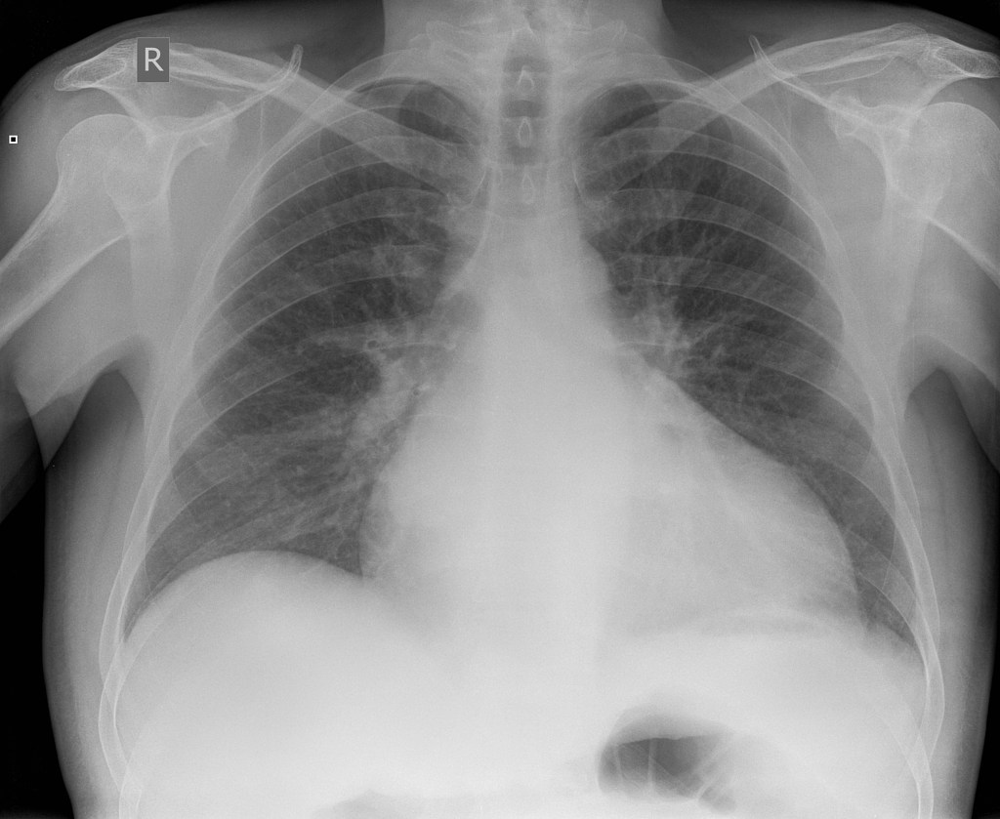

Generated captions:
	t=1.0; det=True
	 exam shows the lung fields to be clear. No pneumonia, pneumothorax or pleural effusion is seen. The heart size is normal. The mediastinal and osseous structures show no significant abnormalities.
	t=0.5; det=False
	 enlarged cardiac silhouette. Tortuous aorta. Pulmonary vascularity normal. Lungs clear. No pleural effusion or pneumothorax. Bones demineralized.


In [99]:
# URL: https://radiopaedia.org/play/2740/entry/32899/case/33212/studies/34237?lang=us
path = "https://prod-images-static.radiopaedia.org/images/10135268/37dd18caa348cb387cf7a5623fc261_jumbo.jpg"
print(f"Actual caption:\n\t"
      f"Cardiomegaly with a globular outline to the heart. Upper lobe venous distension, in keeping with pulmonary venous hypertension.")
predict_captions(trainer, path)

Actual caption: Normal digital PA chest X-ray in a healthy 30 year old male.


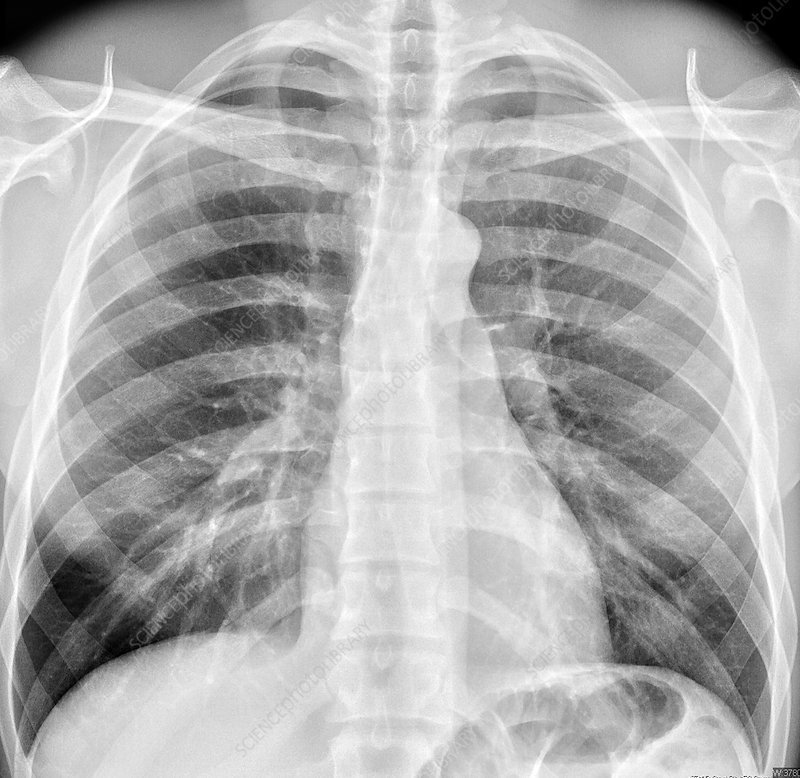

Generated captions:
	t=1.0; det=True
	 right lower lobe airspace disease is present. The left lung is clear. The cardiopericardial silhouette is within normal limits for size. Imaged bony structures of the thorax are intact.
	t=0.5; det=False
	 right lower lobe airspace disease is present, concerning for pneumonia. The left lung is clear. No effusion.


In [101]:
# URL: https://www.sciencephoto.com/media/862268/view/normal-chest-x-ray
path = "https://media.sciencephoto.com/c0/36/64/03/c0366403-800px-wm.jpg"
print("Actual caption: Normal digital PA chest X-ray in a healthy 30 year old male.")
predict_captions(trainer, path)

Actual caption:
	PA chest: extensive bilateral pulmonary nodules are noted with some overlapping. The nodules are of varying sizes with sharp margins.


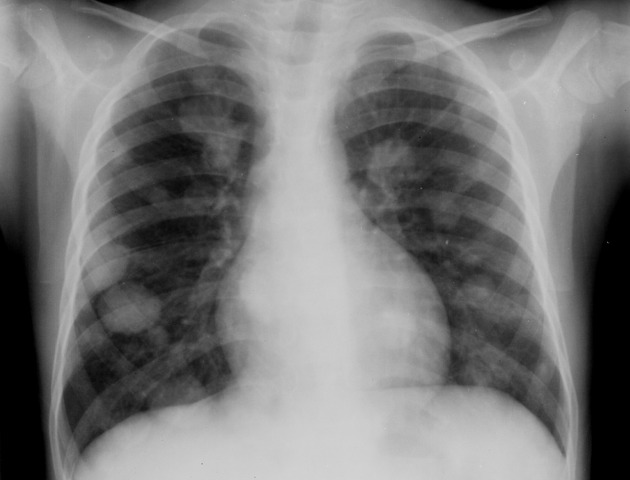

Generated captions:
	t=1.0; det=True
	 anterior chest wall soft tissue density is again noted. The lungs are clear. The heart is within normal limits in size. No bony abnormality is seen.
	t=0.5; det=False
	 the heart size and mediastinal contours are within normal limits. Both lungs are clear. The visualized skeletal structures are unremarkable.


In [102]:
# URL: https://radiopaedia.org/play/41523/entry/746278/case/91068/studies/108638
path = "https://prod-images-static.radiopaedia.org/images/55718422/Screen_Shot_2021-08-18_at_3.09.07_PM_big_gallery.jpeg"
print(f"Actual caption:\n\t"
      f"PA chest: extensive bilateral pulmonary nodules are noted with some overlapping. The nodules are of varying sizes with sharp margins."
)
predict_captions(trainer, path)

Actual caption:
	Radiographic appearance of bronchiectasis. Chest radiograph in a patient with severe bronchiectasis associated with cystic fibrosis shows tram tracks and ring shadows resulting from dilated and thick-walled bronchi. Ill-defined nodular opacities represent mucous plugs.


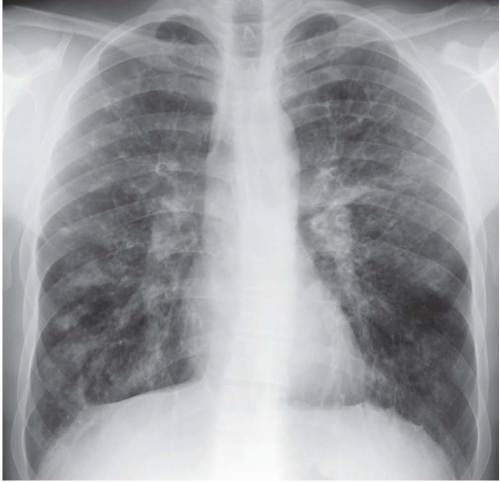

Generated captions:
	t=1.0; det=True
	 COPD with pulmonary hyperinflation. There is a new patchy infiltrate in the right upper lobe. There is a small right pleural effusion. There is no pneumothorax. The heart size is normal.
	t=0.5; det=False
	 exam is limited by patient body habitus. There is thickening of the interstitial markings compatible with interstitial fibrosis. There is blunting of the left costophrenic angle. The cardiac silhouette is normal in size. The visualized bony skeleton is unremarkable.


In [103]:
# URL: https://radiologykey.com/bronchiectasis-2/
path = "https://radiologykey.com/wp-content/uploads/2016/07/C4-FF1-1.gif"
print(f"Actual caption:\n\t"
      f"Radiographic appearance of bronchiectasis. Chest radiograph in a patient with severe bronchiectasis associated with cystic fibrosis shows tram tracks and ring shadows resulting from dilated and thick-walled bronchi. Ill-defined nodular opacities represent mucous plugs."
)
predict_captions(trainer, path)

Actual caption:
	COVID-19 pneumonia. Multifocal patchy opacities in bilateral lungs peripheries.


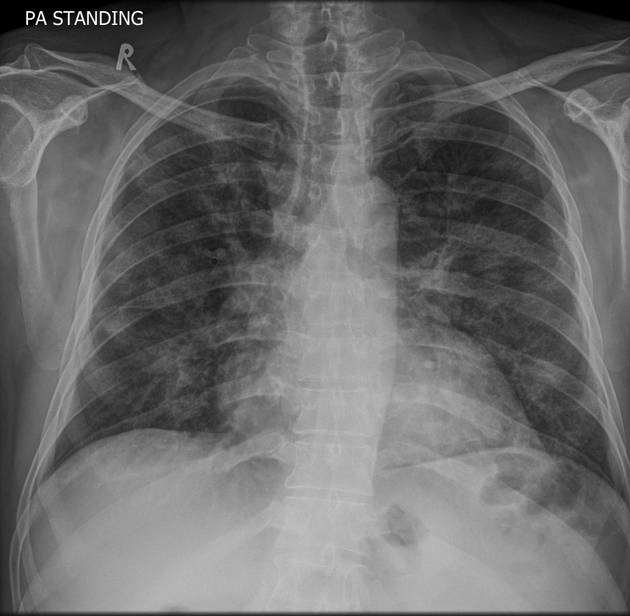

Generated captions:
	t=1.0; det=True
	: The heart size and mediastinal contours are within normal limits. No pneumothorax or pleural effusion is noted. Left lung is clear. Right lung is clear. The visualized skeletal structures are unremarkable.
	t=0.5; det=False
	 CT scan reveals the heart size to remain normal. There is a large hiatal hernia. There is no definite infiltrate or effusion. There is no pneumothorax. There is no significant change in the appearance of the bones.


In [105]:
# URL: https://radiopaedia.org/cases/covid-19-pneumonia-104
path = "https://prod-images-static.radiopaedia.org/images/53519733/IMG-0011-00001_big_gallery.jpeg"
print(f"Actual caption:\n\t"
      f"COVID-19 pneumonia. Multifocal patchy opacities in bilateral lungs peripheries."
)
predict_captions(trainer, path)

Actual caption:
	A 56-year-old male with a history of chronic obstructive pulmonary disease presents with pleuritic chest pain and trouble breathing. Vital signs are significant for a blood pressure of 88/54 mmHg and a pulse of 115/min. On exam, there is jugular venous distension, decreased breath sounds on the right side, with wheezes. A chest radiograph is obtained. 


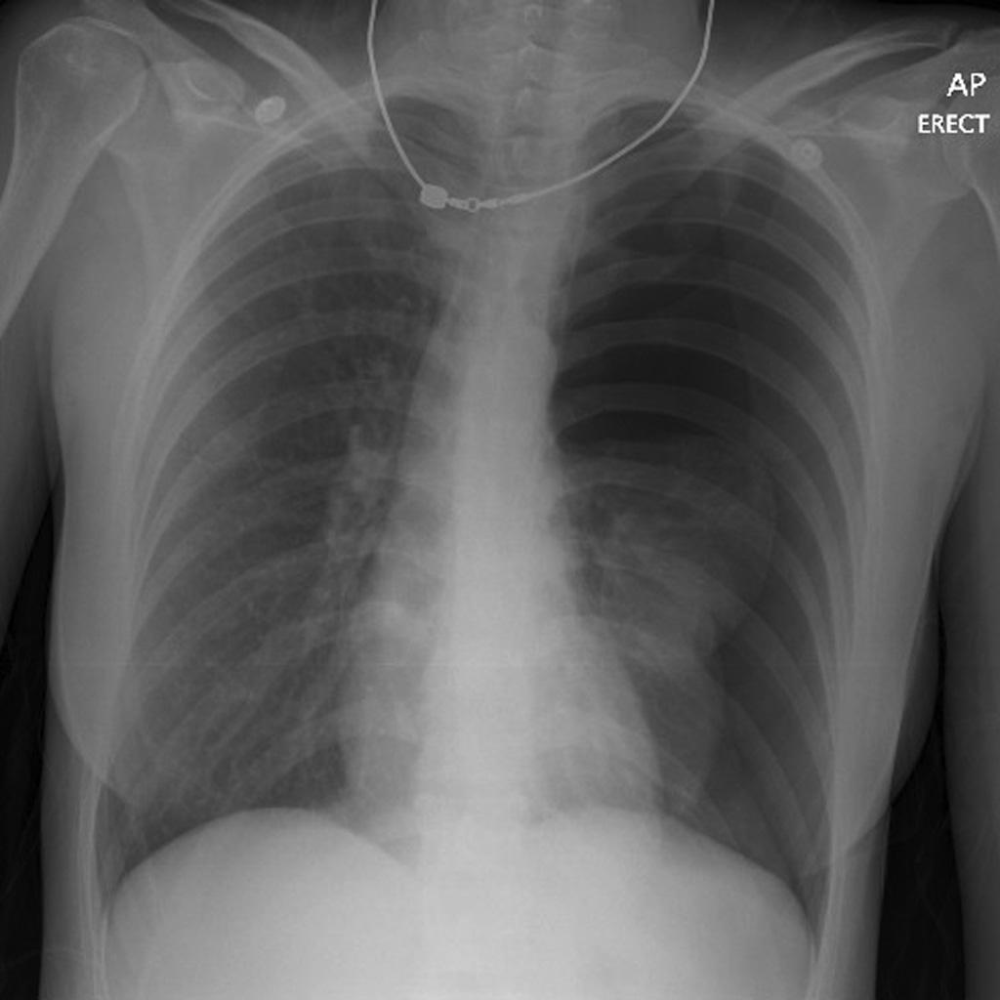

Generated captions:
	t=1.0; det=True
	 study is limited by patient rotation. The heart size is normal. There is no pleural effusion or pulmonary edema. No airspace consolidation identified.
	t=0.5; det=False
	 exam of the chest shows a normal size cardiomediastinal silhouette. There is no evidence of consolidation, mass or pleural effusion.


In [106]:
# URL: https://step2.medbullets.com/pulmonary/120665/tension-pneumothorax
path = "https://upload.medbullets.com/topic/120665/images/tensionpneumo.jpg"
print(f"Actual caption:\n\t"
      f"A 56-year-old male with a history of chronic obstructive pulmonary disease presents with pleuritic chest pain and trouble breathing. Vital signs are significant for a blood pressure of 88/54 mmHg and a pulse of 115/min. On exam, there is jugular venous distension, decreased breath sounds on the right side, with wheezes. A chest radiograph is obtained. "
)
predict_captions(trainer, path)

Actual caption:
	R middle lobe pneumonia


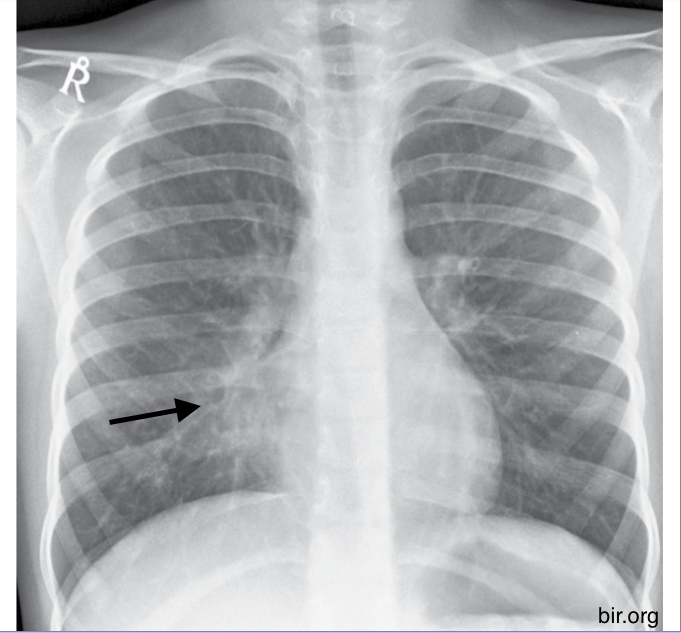

Generated captions:
	t=1.0; det=True
	 frontal view of the chest shows the lungs to be clear. No parenchymal consolidation, pulmonary edema or pleural effusion is identified. The heart size is normal. No significant skeletal abnormality is detected.
	t=0.5; det=False
	/06/02: The heart size is normal. The lungs are clear. No consolidation identified. No pleural effusion is seen.


In [107]:
# URL: https://www.maimonidesem.org/blog/tag/pneumoni
path = "https://images.squarespace-cdn.com/content/v1/5b8645f7266c07b084eb29c7/1565979051946-EAC0MK2ISF5Q61IHUZGE/Screen+Shot+2019-08-15+at+4.16.26+PM.png?format=2500w"
print(f"Actual caption:\n\t"
      f"R middle lobe pneumonia"
)
predict_captions(trainer, path)

Actual caption:
	PA and lateral views of the chest were obtained. There is a 10 cm mass in the right midlung field posteriorly and located in the superior segment of the right lower lobe. There is a lucent area in the superior aspect of the mass that could be secondary to internal cavitation. The mass could either be secondary to a cavitating neoplastic mass or an inflammatory mass as might be seen with fungus or tuberculosis infection. The left lung field is clear. Heart size is normal. Mediastinal and osseous structures show no significant abnormalities.


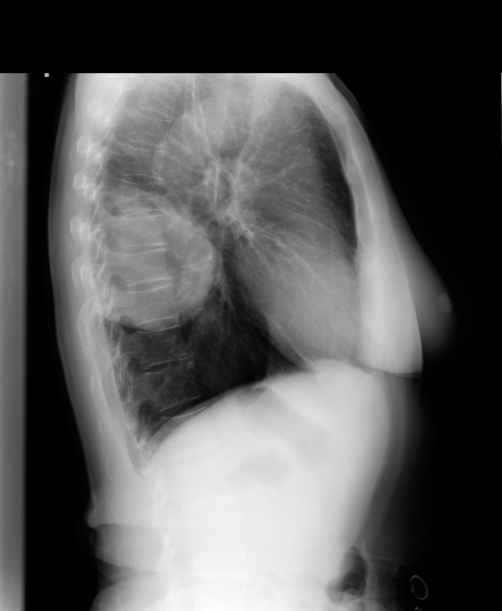

Generated captions:
	t=1.0; det=True
	 exam shows the lung fields to be clear. No pneumonia, pneumothorax or pleural effusion is seen. The heart size is normal. The mediastinal and osseous structures show no significant abnormalities.
	t=0.5; det=False
	 exam shows the lung fields to be clear. The heart, mediastinal and osseous structures show no significant abnormalities.


In [108]:
path = "./pictures/1.2.826.0.1.3680043.8.498.91970043991235021138722410468288723839.png"
print(f"Actual caption:\n\t"
      f"PA and lateral views of the chest were obtained. There is a 10 cm mass in the right midlung field posteriorly and located in the superior segment of the right lower lobe. There is a lucent area in the superior aspect of the mass that could be secondary to internal cavitation. The mass could either be secondary to a cavitating neoplastic mass or an inflammatory mass as might be seen with fungus or tuberculosis infection. The left lung field is clear. Heart size is normal. Mediastinal and osseous structures show no significant abnormalities."
)
predict_captions(trainer, path)

Actual caption:
	Right upper zone pulmonary nodule. Heart size normal. Left lung clear.


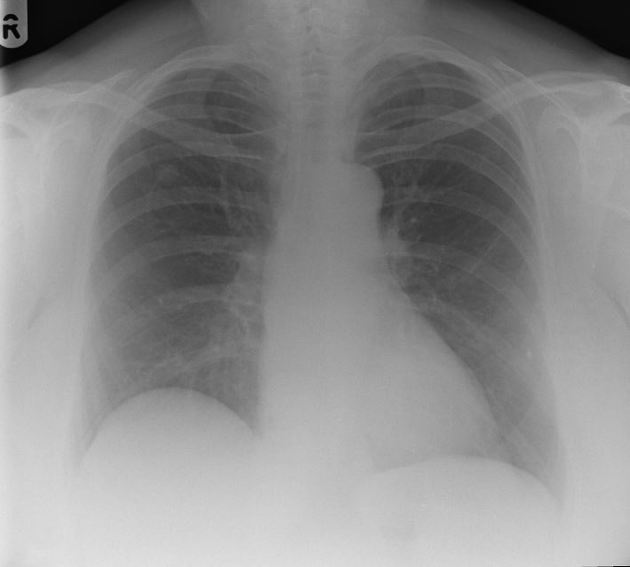

Generated captions:
	t=1.0; det=True
	 frontal view of the chest shows that the lungs are clear. No parenchymal consolidation, pulmonary edema or pleural effusion is identified. The heart size is normal. No significant skeletal abnormality is detected.
	t=0.5; det=False
	 frontal view of the chest shows adequate inspiration. The lungs are clear without focal consolidation, pleural effusion or pneumothorax. Cardiomediastinal silhouette is unremarkable.


In [109]:
# URL: https://radiopaedia.org/cases/pulmonary-hamartoma-31#image-53230777
path = "https://prod-images-static.radiopaedia.org/images/53230775/452afabb3824f5b5ab0059751e3df9_big_gallery.jpeg"
print(f"Actual caption:\n\t"
      f"Right upper zone pulmonary nodule. Heart size normal. Left lung clear."
)
predict_captions(trainer, path)

Actual caption:
	Cavitary lesion in the left lung upper zone. Cavity is surrounded by consolidation. No air fluid level. No other lesions. No effusion. No bone lesions. Rest of the study is unremarkable.


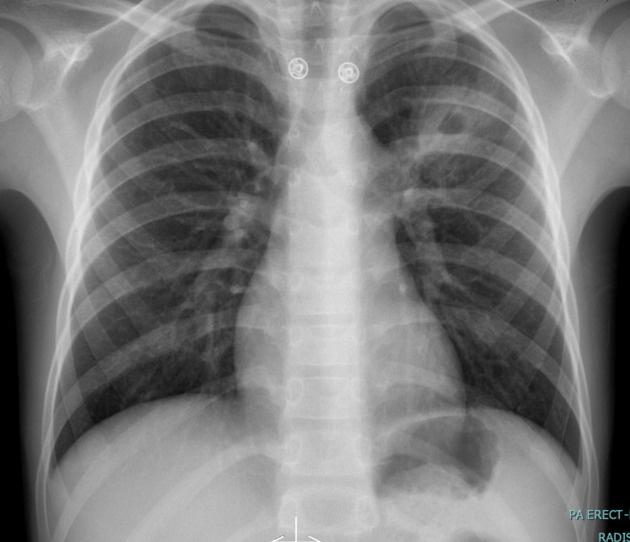

Generated captions:
	t=1.0; det=True
	 right upper lobe consolidation is present. The left lung is clear. The cardiopericardial silhouette is within normal limits for size. Imaged bony structures of the thorax are intact.
	t=0.5; det=False
	 and oblique views of the right ribs show no fracture or other focal lesion.


In [110]:
# URL: https://radiopaedia.org/cases/cavitary-lung-lesion-1
path = "https://prod-images-static.radiopaedia.org/images/57004052/0._big_gallery.jpeg"
print(f"Actual caption:\n\t"
      f"Cavitary lesion in the left lung upper zone. Cavity is surrounded by consolidation. No air fluid level. No other lesions. No effusion. No bone lesions. Rest of the study is unremarkable."
)
predict_captions(trainer, path)

/data/paulenka/dataset_ReXGradient-160K/dataset/deid_png/GRDNBW8A5Z8G2YMQ/GRDN1OVJ1TOKQBJP/studies/1.2.826.0.1.3680043.8.498.57826667727797626823121496337240916203/series/1.2.826.0.1.3680043.8.498.43493520668703837226452032615692726301/instances/1.2.826.0.1.3680043.8.498.46932928770987265801096398601935094297.png
Actual caption:
	Trachea is midline. Heart is shifted to the left, as before. Extensive cystic destruction of the left lung is seen with areas of airspace disease and/or fluid. There is architectural distortion, nodularity and volume loss in the right upper lobe.


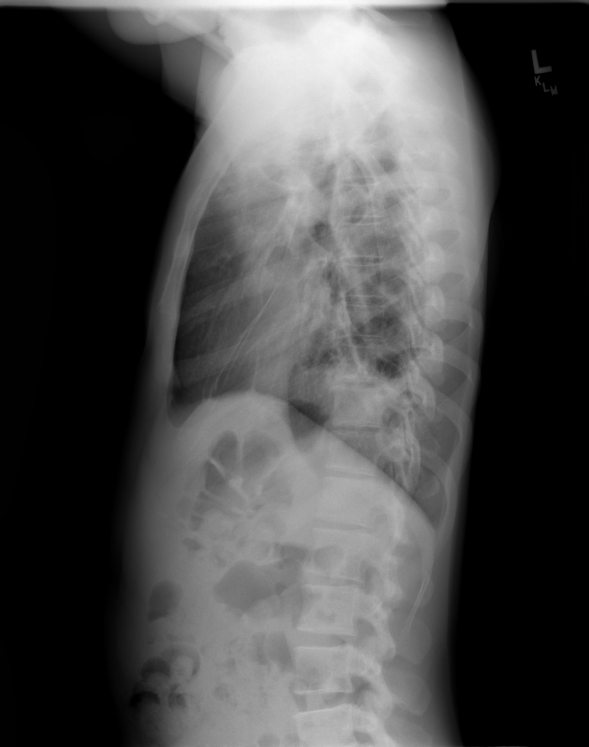

Generated captions:
	t=1.0; det=True
	 and left lower lobe airspace disease is present. There is a small left pleural effusion. Right lung is clear. Heart size is normal.
	t=0.5; det=False
	 and bilateral pleural effusions have increased in the interval and are now more prominent. The cardiopericardial silhouette is within normal limits for size. The patient is status post upper lumbar fusion. There is no evidence for pneumothorax.


In [114]:
img_path, actual_caption = get_info(TEST_CSV, 968)
print(img_path)
print("Actual caption:", actual_caption, sep="\n\t")
predict_captions(trainer, img_path)

/data/paulenka/dataset_ReXGradient-160K/dataset/deid_png/GRDNBW8A5Z8G2YMQ/GRDN5AR623MM9JLQ/studies/1.2.826.0.1.3680043.8.498.14545398587231937334008122194630221931/series/1.2.826.0.1.3680043.8.498.22148377031341646113447548953993579180/instances/1.2.826.0.1.3680043.8.498.98449470353197789376238128781773416838.png
Actual caption:
	There is extensive bullous formation throughout the left lung with opacity at the left lung base and streaky opacity in the right upper lobe. Many of these changes may be chronic in nature possibly the result of prior tuberculous infection. An active component particularly in the left lower lobe is a definite consideration. Heart is within normal limits in size. No bony abnormality is seen.


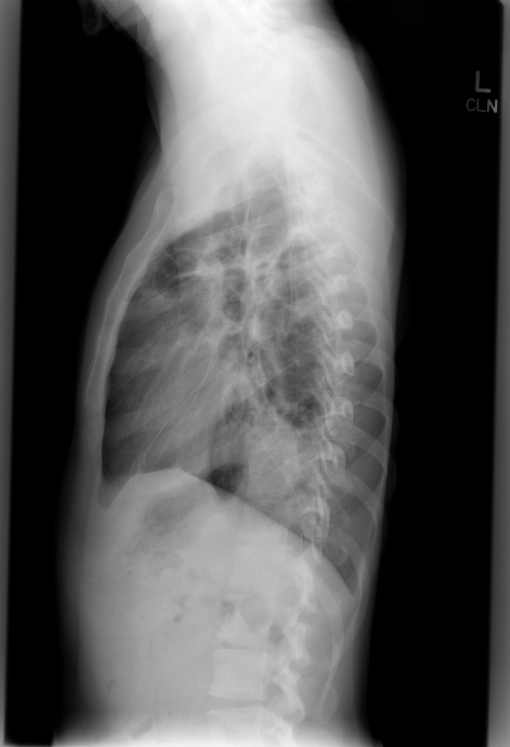

Generated captions:
	t=1.0; det=True
	 right lower lobe airspace disease is present. There is also a small right pleural effusion. The left lung is clear. The heart is within normal limits in size.
	t=0.5; det=False
	 airways thickening is present. The patient has a right pleural effusion. There is a small right pleural effusion. The left lung is clear. The cardiopericardial silhouette is within normal limits for size. Imaged bony structures of the thorax are intact.


In [113]:
img_path, actual_caption = get_info(TEST_CSV, 3050)
print(img_path)
print("Actual caption:", actual_caption, sep="\n\t")
predict_captions(trainer, img_path)

In [ ]:
# %%script echo "Skip this cell"

# Clean up resources. Place this code at the end of the program
import os, signal
os.kill(os.getpid(), signal.SIGTERM)  # you can use signal.SIGKILL for Linux, but not for Windows

## Conclusions



The VisionGPT2 model effectively detects common conditions, such as heart size, but demonstrates poor performance in detecting critical pathologies, such as lung lesions and tuberculosis, primarily due to the significant imbalance of the training set and the fact that training pipeline of the neural network architecture ignores information from additional columns and processes only one column in CSV file. The study concludes that deterministic or low-temperature responses (e.g., t = 0.1) are necessary for clinical reliability, as high-temperature conditions often lead to meaningless or confusing descriptions. Future developments in clinically-ready systems will require disease-balanced datasets and integration of dissimilar (manifold) data from multiple sources into a single learning pipeline.